# Impact of Airbnb in major UK cities - Bristol

This project is aimed at local goverments deciding on policies regarding Airbnb within their area. The city of Bristol will be covered in this project. This project will use data on Airbnb listings to give insight into the impact of Airbnb in Bristol.

The data that I'll be using below is from an organisation called Inside Airbnb, and it is licensed under a Creative Commons Attribution 4.0 International License. I'm also using map data from Ordnance Survey open data under an Open Government Licence [https://www.nationalarchives.gov.uk/doc/open-government-licence/version/3/]

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as datetime
import re
import geopandas as gpd
from shapely.geometry import Point


#Importing modules for regression model to determine factors in predicting Airbnb prices
import pycaret
from pycaret.datasets import get_data
from pycaret.regression import *

#For multicollinearity VIF testing
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

#Modules for time-series modelling
import sklearn
import statsmodels
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

from statsmodels.graphics import tsaplots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
import pycaret.time_series as pyc_time
from pycaret.time_series import *
from statsmodels.tsa.statespace.sarimax import SARIMAX

## Data description

**For listings file**

 - `id`: unique identifier for the listing
 - `name`: name of the listing
 - `host_id`: unique identifier for each host 
 - `host_name`: name of the host 
 - `neighbourhood_group`: group within a neighbourhood    
 - `neighbourhood`: the neighbourhood which a given Airbnb is located in                    
 - `latitude`: the latitiude of the listing using World Geodetic System (WGS84)
 - `longitude`: the longitude of the listing using WGS84                       
 - `room_type`: the type of listing on Airbnb, e.g. whether it is an entire house/apartment to yourself or just a room to yourself                    
 - `price`: the price per night for a given listing                            
 - `minimum_nights`: the minimum number of nights a listing can be booked for                   
 - `number_of_reviews`: the number of reviews that listing has                 
 - `last_review`: date of the most recent review left                      
 - `reviews_per_month`: number of reviews per listing per month              
 - `calculated_host_listings_count`: the number of listings a given host has within a city   
 - `availability_365`: how many days the listing is available              
 - `number_of_reviews_ltm`: the number of reviews for a listing in the last 12 months             
 - `license`                         

# Bristol

### Reading in data and summary statistics for Bristol

In [2]:
#Reading in the csv files

list_jun23_bristol = pd.read_csv('listings_Bristol_Airbnb_jun2023.csv')
coords = [Point(xy) for xy in zip(list_jun23_bristol['longitude'], list_jun23_bristol['latitude'])]
geo_list_jun23_bristol = gpd.GeoDataFrame(list_jun23_bristol, geometry=coords, crs='EPSG:4326')
reviews_jun23_bristol = pd.read_csv('reviews_Bristol_Airbnb_jun2023.csv')

list_jun23_bristol_cp = list_jun23_bristol.copy()
geo_list_jun23_bristol_cp = geo_list_jun23_bristol.copy()
reviews_jun23_bristol_cp = reviews_jun23_bristol.copy()

In [3]:
geo_list_jun23_bristol.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              2464 non-null   int64   
 1   name                            2464 non-null   object  
 2   host_id                         2464 non-null   int64   
 3   host_name                       2464 non-null   object  
 4   neighbourhood_group             0 non-null      float64 
 5   neighbourhood                   2464 non-null   object  
 6   latitude                        2464 non-null   float64 
 7   longitude                       2464 non-null   float64 
 8   room_type                       2464 non-null   object  
 9   price                           2464 non-null   int64   
 10  minimum_nights                  2464 non-null   int64   
 11  number_of_reviews               2464 non-null   int64   
 12  last_review 

In [4]:
geo_list_jun23_bristol.drop(['neighbourhood_group', 'license'], axis=1, inplace=True)

In [5]:
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              2464 non-null   int64  
 1   name                            2464 non-null   object 
 2   host_id                         2464 non-null   int64  
 3   host_name                       2464 non-null   object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   2464 non-null   object 
 6   latitude                        2464 non-null   float64
 7   longitude                       2464 non-null   float64
 8   room_type                       2464 non-null   object 
 9   price                           2464 non-null   int64  
 10  minimum_nights                  2464 non-null   int64  
 11  number_of_reviews               2464 non-null   int64  
 12  last_review                     21

The vast majority of columns have no missing values. 2 columns have no non-missing values, and therefore those two columns are empty and could be dropped. `last_review` and `reviews_per_month` both have 352 missing values, which reprsents 14.3% of datapoints in those columns being missing.

In [6]:
#Dropping neighbourhood group and license as they have no non-null values

list_jun23_bristol.drop(['neighbourhood_group', 'license'], axis=1, inplace=True)

No licenses are required for Airbnb rental in Bristol currently; this explains why none of the listings have licenses.

In [7]:
reviews_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116577 entries, 0 to 116576
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  116577 non-null  int64 
 1   date        116577 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.8+ MB


There are no missing values in this dataset.

In [8]:
list_jun23_bristol.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,70820,Townhouse in Bristol · ★4.77 · 1 bedroom · 1 b...,360195,Sarah,Windmill Hill,51.43843,-2.59183,Private room,41,4,182,2023-06-04,1.54,5,7,11
1,117122,Condo in Bristol · ★4.95 · 1 bedroom · 1 bed ·...,591555,Marcus,Hotwells & Harbourside,51.44976,-2.61000,Private room,96,1,177,2023-06-21,1.21,1,354,13
2,176306,Townhouse in Bristol · ★4.76 · 1 bedroom · 1 b...,708175,Orla,Southville,51.44174,-2.60297,Private room,32,5,48,2023-06-07,0.37,1,37,9
3,307634,Townhouse in Bristol · ★4.63 · 1 bedroom · 1 b...,1582810,Wendy,Easton,51.46487,-2.55690,Private room,38,6,32,2023-01-31,0.43,3,153,4
4,390781,Home in Bristol · ★4.90 · 1 bedroom · 1 bed · ...,1954565,Fiona,Brislington West,51.44444,-2.55783,Private room,35,2,54,2023-06-24,0.39,2,0,6


In [9]:
reviews_jun23_bristol.head()

,listing_id,date
0,70820,2013-10-18
1,70820,2013-10-28
2,70820,2013-11-12
3,70820,2014-05-17
4,70820,2014-06-15


In [10]:
#converting dates in review and listing dataset into datetimes

reviews_jun23_bristol['date'] = pd.to_datetime(reviews_jun23_bristol['date'], format="%Y/%m/%d")
reviews_jun23_bristol.info()

list_jun23_bristol['last_review'] = pd.to_datetime(list_jun23_bristol['last_review'], format="%Y/%m/%d")
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116577 entries, 0 to 116576
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   listing_id  116577 non-null  int64         
 1   date        116577 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.8 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              2464 non-null   int64         
 1   name                            2464 non-null   object        
 2   host_id                         2464 non-null   int64         
 3   host_name                       2464 non-null   object        
 4   neighbourhood                   2464 non-null   object        
 5   latitude                        2464 non-null   f

In [11]:
reviews_jun23_bristol['Year'] = reviews_jun23_bristol['date'].dt.year #extracting the year from the date
reviews_jun23_bristol['Month'] = reviews_jun23_bristol['date'].dt.month #extracting the month from the date
list_jun23_bristol = list_jun23_bristol.rename(columns={'id': 'listing_id'})
geo_list_jun23_bristol = geo_list_jun23_bristol.rename(columns={'id': 'listing_id'})

### Number of bedrooms and price per bedroom

In [12]:
def rating_extract(series): #this function extracts the star rating of a listing from the name column
    pat = f"\U00002605(\d+.\d+)"
    rating = series.str.extract(pat)
    return rating

In [13]:
def extract_bedrooms(row): #this extracts the number of bedrooms a listing has from the name column
    l = ['bedroom', 'bedrooms']
    pat = f"(\d+)[\s-](?:{'|'.join(l)})"

    if row['room_type'] != "Entire home/apt":
        return 1
    else:
        num_of_bedrooms_match = re.search(pat, row['name']) #extracting the number of bedrooms from the name of the listing
        if num_of_bedrooms_match:
            num_of_bedrooms = num_of_bedrooms_match.group(1)
            return int(num_of_bedrooms)
        else:
            return 1 #1 seems to be the most common number of bedrooms hence why 1 is returned here

In [14]:
list_jun23_bristol['no_of_bedrooms'] = list_jun23_bristol.apply(extract_bedrooms, axis=1)
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2464 non-null   int64         
 1   name                            2464 non-null   object        
 2   host_id                         2464 non-null   int64         
 3   host_name                       2464 non-null   object        
 4   neighbourhood                   2464 non-null   object        
 5   latitude                        2464 non-null   float64       
 6   longitude                       2464 non-null   float64       
 7   room_type                       2464 non-null   object        
 8   price                           2464 non-null   int64         
 9   minimum_nights                  2464 non-null   int64         
 10  number_of_reviews               2464 non-null   int64         
 11  last

In [15]:
list_jun23_bristol['rating'] = rating_extract(list_jun23_bristol['name'])
list_jun23_bristol['rating'] = list_jun23_bristol['rating'].astype('float')

list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2464 non-null   int64         
 1   name                            2464 non-null   object        
 2   host_id                         2464 non-null   int64         
 3   host_name                       2464 non-null   object        
 4   neighbourhood                   2464 non-null   object        
 5   latitude                        2464 non-null   float64       
 6   longitude                       2464 non-null   float64       
 7   room_type                       2464 non-null   object        
 8   price                           2464 non-null   int64         
 9   minimum_nights                  2464 non-null   int64         
 10  number_of_reviews               2464 non-null   int64         
 11  last

In [16]:
list_jun23_bristol['price_per_bedroom'] = list_jun23_bristol['price']/list_jun23_bristol['no_of_bedrooms']

list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2464 non-null   int64         
 1   name                            2464 non-null   object        
 2   host_id                         2464 non-null   int64         
 3   host_name                       2464 non-null   object        
 4   neighbourhood                   2464 non-null   object        
 5   latitude                        2464 non-null   float64       
 6   longitude                       2464 non-null   float64       
 7   room_type                       2464 non-null   object        
 8   price                           2464 non-null   int64         
 9   minimum_nights                  2464 non-null   int64         
 10  number_of_reviews               2464 non-null   int64         
 11  last

In [17]:
no_rating = list_jun23_bristol[list_jun23_bristol['rating'].isnull()]
no_rating.head(15)

,listing_id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,no_of_bedrooms,rating,price_per_bedroom
26,1748057,Condo in Bristol · 2 bedrooms · 2 beds · 1 bath,8568332,Lynn,Central,51.454120,-2.588410,Entire home/apt,90,1,0,NaT,NaN,1,165,0,2,NaN,45.000000
47,3960179,Home in Bristol · 3 bedrooms · 4 beds · 1.5 baths,20522861,Peter,Avonmouth & Lawrence Weston,51.496060,-2.646810,Entire home/apt,164,5,1,2016-04-27,0.01,2,90,0,3,NaN,54.666667
59,4594920,Home in Bishopston · ★New · 4 bedrooms · 5 bed...,23818155,Emma,Redland,51.479475,-2.593468,Entire home/apt,249,3,0,NaT,NaN,1,83,0,4,NaN,62.250000
88,7738447,Home in Hotwells · 1 bedroom · 1 bed · 1.5 baths,5063443,Joanna And Glyn,Hotwells & Harbourside,51.448560,-2.616580,Entire home/apt,90,25,0,NaT,NaN,2,0,0,1,NaN,90.000000
98,8142384,Home in Bristol · 1 bedroom · 1 bed · 1 bath,41369557,Jonathan,Ashley,51.471050,-2.587520,Private room,45,2,1,2015-09-05,0.01,1,145,0,1,NaN,45.000000
131,11237429,Home in Bristol City · 1 bedroom · 1 bed · 1 p...,9447591,Alia,Knowle,51.434147,-2.583417,Private room,70,3,0,NaT,NaN,2,364,0,1,NaN,70.000000
155,12768764,Townhouse in Greenbank · 1 bedroom · 2 beds · ...,46931021,Polly,Easton,51.466590,-2.560250,Private room,29,3,1,2023-04-10,0.38,2,65,1,1,NaN,29.000000
161,13133203,Townhouse in Bristol · 3 bedrooms · 4 beds · 1...,20522861,Peter,Avonmouth & Lawrence Weston,51.497250,-2.647100,Entire home/apt,189,7,1,2022-02-13,0.06,2,365,0,3,NaN,63.000000
194,14985143,Rental unit in Cotham · ★New · 3 bedrooms · 3 ...,75254151,Charlotte,Cotham,51.467427,-2.593214,Entire home/apt,204,3,0,NaT,NaN,1,9,0,3,NaN,68.000000
201,15315970,Home in Bristol · 1 bedroom · 1 bed · 1 privat...,2552998,Sadie,Frome Vale,51.482070,-2.521850,Private room,89,1,0,NaT,NaN,2,89,0,1,NaN,89.000000


For properties with no reviews, I'll input null values with zero; else I'll input the mean rating.

In [18]:
list_jun23_bristol['rating'].fillna(list_jun23_bristol.apply(lambda row: np.mean(list_jun23_bristol['rating']) if pd.notna(row['last_review']) else 0, axis=1), inplace=True)

In [19]:
geo_list_jun23_bristol['no_of_bedrooms'] = geo_list_jun23_bristol.apply(extract_bedrooms, axis=1)
geo_list_jun23_bristol['rating'] = rating_extract(geo_list_jun23_bristol['name'])
geo_list_jun23_bristol['rating'] = geo_list_jun23_bristol['rating'].astype('float')
geo_list_jun23_bristol['price_per_bedroom'] = geo_list_jun23_bristol['price']/geo_list_jun23_bristol['no_of_bedrooms']
geo_list_jun23_bristol['rating'].fillna(geo_list_jun23_bristol.apply(lambda row: np.mean(geo_list_jun23_bristol['rating']) if pd.notna(row['last_review']) else 0, axis=1), inplace=True)
geo_list_jun23_bristol.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   listing_id                      2464 non-null   int64   
 1   name                            2464 non-null   object  
 2   host_id                         2464 non-null   int64   
 3   host_name                       2464 non-null   object  
 4   neighbourhood                   2464 non-null   object  
 5   latitude                        2464 non-null   float64 
 6   longitude                       2464 non-null   float64 
 7   room_type                       2464 non-null   object  
 8   price                           2464 non-null   int64   
 9   minimum_nights                  2464 non-null   int64   
 10  number_of_reviews               2464 non-null   int64   
 11  last_review                     2112 non-null   object  
 12  reviews_per_

In [20]:
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2464 entries, 0 to 2463
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2464 non-null   int64         
 1   name                            2464 non-null   object        
 2   host_id                         2464 non-null   int64         
 3   host_name                       2464 non-null   object        
 4   neighbourhood                   2464 non-null   object        
 5   latitude                        2464 non-null   float64       
 6   longitude                       2464 non-null   float64       
 7   room_type                       2464 non-null   object        
 8   price                           2464 non-null   int64         
 9   minimum_nights                  2464 non-null   int64         
 10  number_of_reviews               2464 non-null   int64         
 11  last

In [21]:
list_jun23_bristol.describe()

,listing_id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,no_of_bedrooms,rating,price_per_bedroom
count,2.464000e+03,2.464000e+03,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2112.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000,2464.000000
mean,3.345244e+17,1.530164e+08,51.461988,-2.589623,165.080763,3.830357,47.312094,1.753045,17.366071,163.175325,13.502841,1.679383,4.068449,113.101351
std,3.776001e+17,1.544804e+08,0.017907,0.027311,393.823456,18.221637,84.914887,1.748846,41.513499,133.630158,19.784671,1.198306,1.681966,256.903751
min,7.082000e+04,2.198970e+05,51.406190,-2.696086,14.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000,1.000000,0.000000,12.500000
25%,3.280988e+07,3.247805e+07,51.452100,-2.608045,58.000000,1.000000,3.000000,0.530000,1.000000,29.000000,1.000000,1.000000,4.460000,47.000000
50%,5.248896e+07,8.774505e+07,51.461319,-2.592630,97.000000,2.000000,15.000000,1.145000,2.000000,149.000000,6.000000,1.000000,4.750000,65.000000
75%,7.153600e+17,2.364816e+08,51.471533,-2.575490,149.000000,2.000000,52.000000,2.442500,5.000000,303.250000,18.000000,2.000000,4.920000,92.000000
max,9.222548e+17,5.215925e+08,51.514420,-2.511810,11499.000000,500.000000,894.000000,13.770000,164.000000,365.000000,190.000000,18.000000,5.000000,3833.000000


The minimum price per night for an Airbnb in Bristol is £14 per night and the maximum price is £11,499 per night. 50\% of the listings are priced between £58 per night and £149 per night. There is a clear outlier in the minimum number of nights column of 500 nights, which is unusual as Airbnb is for short term rentals, not long term rentals. The median number of days a listing is available per year is 149 days. There is at least one listing that is available every day of the year, which makes sense as some people rent out properties on Airbnb full-time. 

50\% of hosts in Bristol have between 1 and 5 listings. Other than the `availability_365` column, the other numerical columns show a high level of skewness; this makes sense due to some listings being very unique properties, and due to some hosts who are extremely successful on the platform and have a lot of listings and/or very popular listings that get booked a lot. 

### Exploratory data analysis

In [22]:
numeric_cols = ['price', 'minimum_nights', 'availability_365', 'number_of_reviews', 'no_of_bedrooms', 'price_per_bedroom']

def numeric_col_distributions(dataframe):
    for col in numeric_cols:
        #print("Column name: ",col)
    
        #print('Skew :',round(dataframe[col].skew(), 2))
    
        plt.figure(figsize = (15, 4))
    
        plt.subplot(1, 2, 1)
    
        #dataframe[col].hist(bins = 10, grid = False)
        sns.histplot(data=dataframe, x=col)
        
        plt.title(col + ',' + ' ' + 'Skew: {}'.format(np.round(dataframe[col].skew(), 2)))
    
        plt.ylabel('count')
        
        plt.xlabel(col)
    
        plt.subplot(1, 2, 2)
    
        sns.boxplot(x = dataframe[col])

In [23]:
def neighbourhood_stats(dataframe):
    plt.figure()
    sns.countplot(x='neighbourhood', data=dataframe, order=dataframe['neighbourhood'].value_counts().index)
    plt.xticks(rotation=90)
    plt.title('Number of Airbnbs by neighbourhood')
    #rotate the x axis labels so they can be read
    
    plt.figure()
    fig= plt.figure(figsize = (9, 18))
    sns.heatmap(pd.crosstab(index = dataframe['neighbourhood'], columns = dataframe['room_type']), annot = True, fmt = 'g')
    
    
    median_price_neighbourhood = pd.pivot_table(dataframe, values=['price_per_bedroom'], index=['neighbourhood'], aggfunc=np.median)
    plt.figure(figsize=(25, 55))
    median_price_neighbourhood.sort_values('price_per_bedroom').plot(kind='barh')
    plt.xlabel('Price per bedroom per night')
    plt.title('Median price per bedroom per neighbourhood')
    
    plt.show()

In [24]:
def seasonal_stats(dataframe):
    plt.figure()
    sns.countplot(x='Year', data=dataframe)
    plt.xticks(rotation=90)
    plt.title('Number of Stays in Airbnb per year')
    #rotate the x axis labels so they can be read
    
    plt.figure()
    sns.countplot(x='Month', data=dataframe)
    plt.title('Number of stays per month')
    plt.show()

In [25]:
def correlation_map(dataframe):
    plt.figure(figsize = (12, 7))
    sns.heatmap(dataframe.corr(), annot = True, fmt = '.2f')
    plt.show()

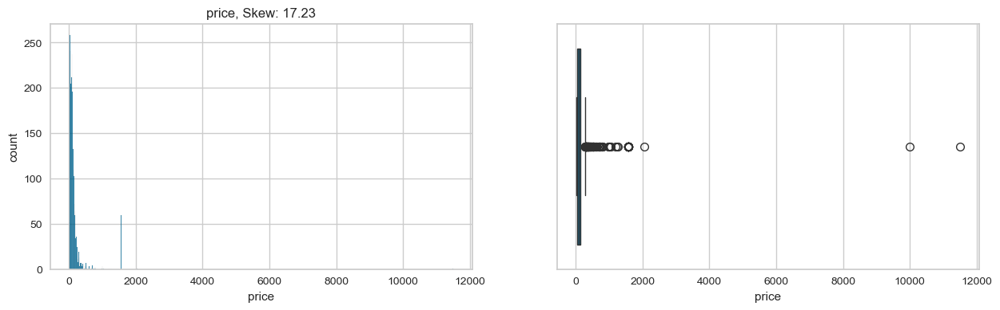

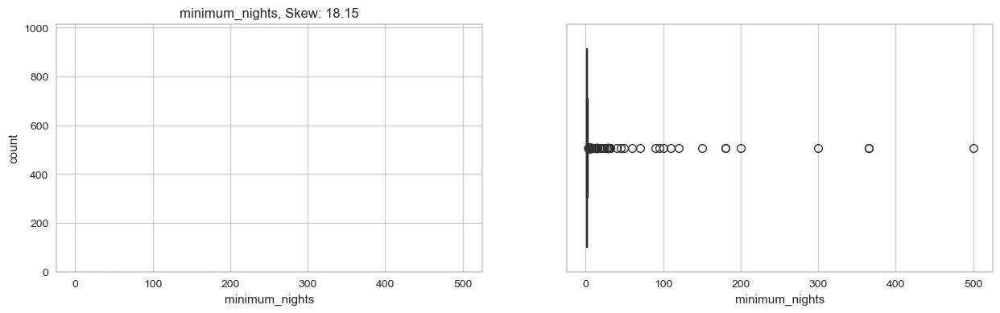

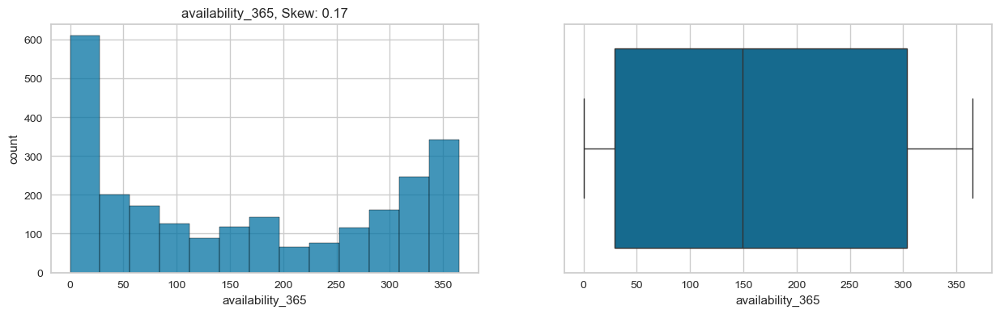

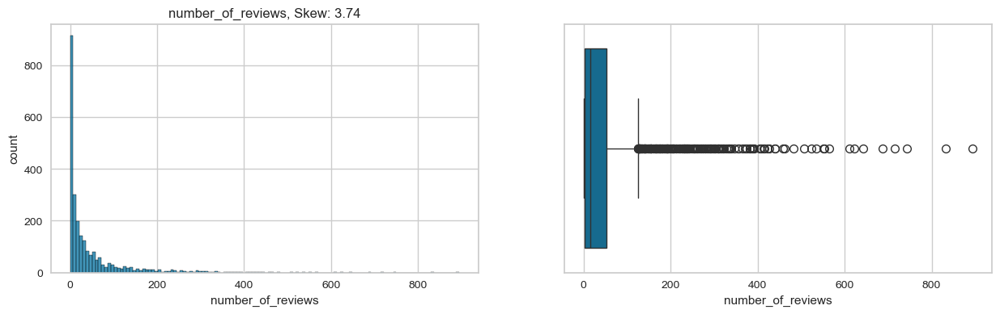

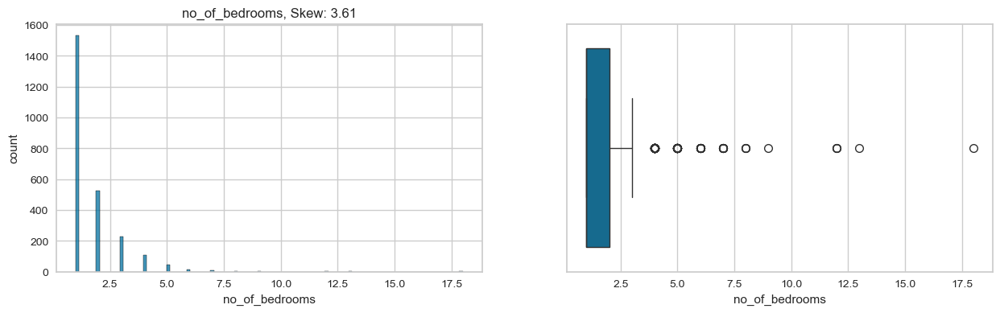

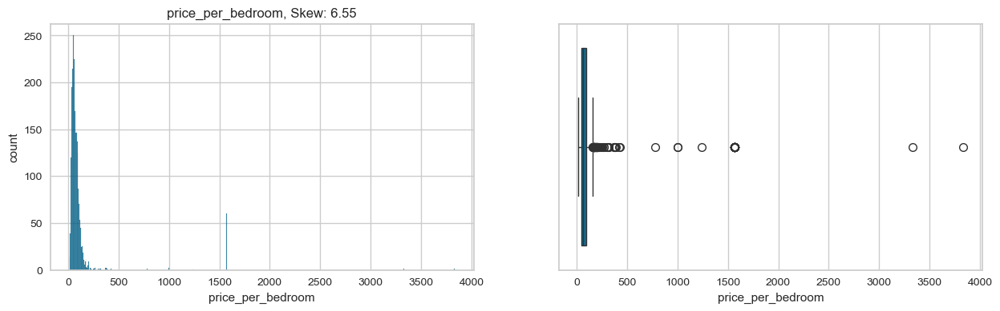

In [26]:
numeric_col_distributions(list_jun23_bristol)
plt.show()

The number of days an Airbnb is listed as available doesn't have any outliers and isn't very skewed, whereas price, minimum number of nights, and number of reviews are skewed due to very unique listings or very popular listings that aren't representative of the average Airbnb. Therefore, when looking at the average price by neighbourhood or room type, I will use the median as my average measure instead of the mean, as the mean is more vulnerable to outliers than the median. It may be possible that some of the outliers in minimum number of nights, particularly the ones that are greater than 50 nights may be erroneous. It makes sense that there are very few listings that are more than 5 bedrooms, as residential properties with more than 5 bedrooms are rare in the UK, so therefore there are going to be few listings with 5 or more bedrooms. Price per bedroom is less skewed than price, and this may be because it's per room and isn't impacted by a property being larger and likely more expensive.

All the data that is heavily skewed is right skewed, meaning that the mean of the data is greater than the median.

In [27]:
over_5_bedrooms = list_jun23_bristol[list_jun23_bristol['no_of_bedrooms'] > 5]

over_5_bedrooms.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28 entries, 221 to 2438
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      28 non-null     int64         
 1   name                            28 non-null     object        
 2   host_id                         28 non-null     int64         
 3   host_name                       28 non-null     object        
 4   neighbourhood                   28 non-null     object        
 5   latitude                        28 non-null     float64       
 6   longitude                       28 non-null     float64       
 7   room_type                       28 non-null     object        
 8   price                           28 non-null     int64         
 9   minimum_nights                  28 non-null     int64         
 10  number_of_reviews               28 non-null     int64         
 11  last

Only 17 listings out of 2112 listings in Bristol with reviews have more than 5 bedrooms. Combining this with the fact that the concern of local government about the impact of Airbnb is the impact Airbnb potentially has on residential property, I'll drop any listings with more than 5 bedrooms as residential properties with more than 5 bedrooms are uncommon in the UK.

In [28]:
list_jun23_bristol = list_jun23_bristol[list_jun23_bristol['no_of_bedrooms'] <= 5]

#list_jun23_bristol['no_of_bedrooms'].value_counts()

In [29]:
list_jun23_bristol['rating'].value_counts()

0.000000    341
5.000000    328
4.746524    221
4.890000     56
4.920000     54
           ... 
3.950000      1
3.890000      1
3.700000      1
4.020000      1
2.750000      1
Name: rating, Length: 120, dtype: int64

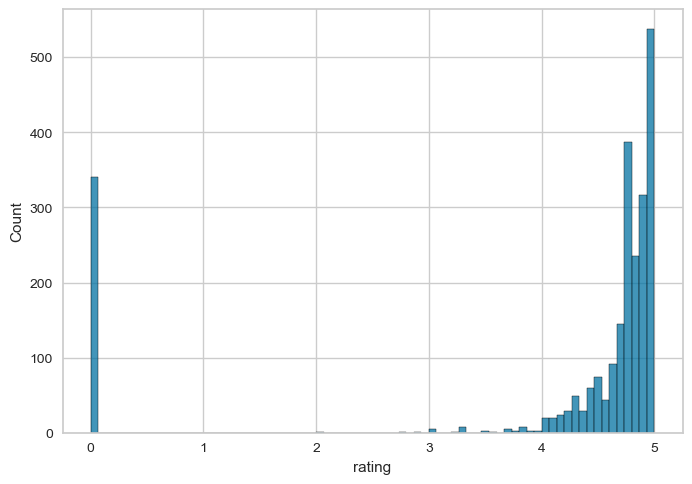

In [30]:
sns.histplot(data=list_jun23_bristol, x='rating')
plt.show()

There are 341 listings with 0 stars in terms of reviews; this is partially indicative of a lack of reviews for these properties rather than them necessarily being terrible. The vast majority of Airbnbs are rated 4 stars or above, indicating that the majority of Airbnbs in Bristol are likely of at minimum decent quality and they're generally safe. However, further research would need to be done to give a more detailed picture of the quality and safety of Airbnbs in Bristol.

In [31]:
list_jun23_bristol['minimum_nights'].value_counts()

1      959
2      898
3      237
4       94
5       77
7       57
14      26
6       16
30      16
28      11
10       9
15       4
21       2
180      2
365      2
29       2
31       2
25       2
20       2
95       1
70       1
150      1
300      1
12       1
49       1
90       1
45       1
110      1
100      1
200      1
22       1
120      1
9        1
500      1
40       1
32       1
60       1
Name: minimum_nights, dtype: int64

The vast majority of listings have minimum stays of fewer than 30 nights, suggesting that Airbnb is likely predominately used by tourists or short stay business trips rather than as long term rentals, which may have a negative impact on the hotel industry in Bristol. 

In [32]:
list_jun23_bristol['room_type'].value_counts()

Entire home/apt    1582
Private room        834
Hotel room           15
Shared room           5
Name: room_type, dtype: int64

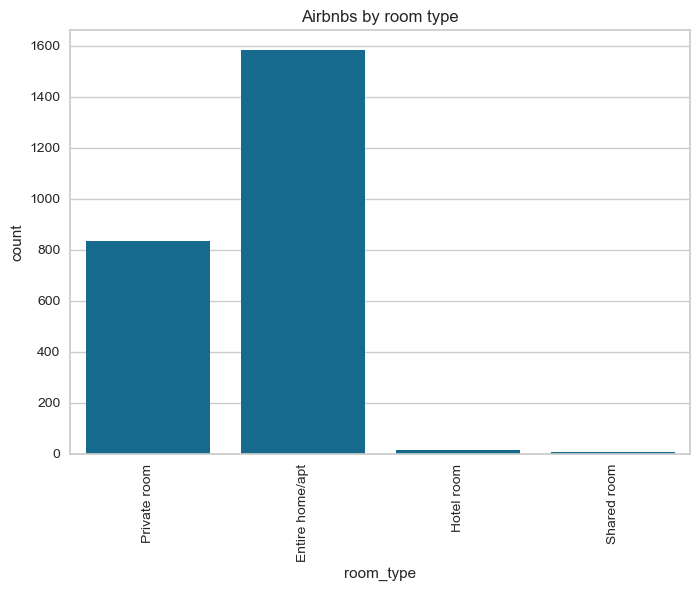

In [33]:
#list_jun23_bristol['room_type'].value_counts(normalize=True)
sns.countplot(x='room_type', data=list_jun23_bristol)
plt.xticks(rotation=90)
plt.title('Airbnbs by room type')
#rotate the x axis labels so they can be read
plt.show()

The majority of listings are entire homes. The next most popular listing type is a private room. The fact that the majority of listings are private homes (1,582 listings) could cause issues with housing affordability, especially to rent, as this means these homes can't be used for long term buy-to-let rentals. Some of these homes may be people's own homes that they rent whilst they're away on holiday, though it is likely that the majority are rented out exclusively as Airbnbs. 

As of the end of October 2023, there are currently only 1,382 properties available to rent in Bristol according to Rightmove (this figure includes homes that have already been let agreed) which is lower than the number of listings that are entire homes. The total private rental market in Bristol is ~55,000 properties (this is got from the BRE Dwelling Level Housing Stock Modelling and Database report done for Bristol in August 2023) though this figure is all the properties being privately rented or available to privately rent. Although the listings that are entire home listings on Airbnb is only ~2.9% of the total private rental stock in Bristol, having the entire home listings be Airbnbs rather than private rental property reduces the stock available to rent, increasing demand on the remaining rental stock, leading to rising rents, which is going to have a negative impact on the quality of life of people living in Bristol, especially at a time when the UK economy is suffering from high inflation and high interest rates.

In [34]:
entire_homes_bristol = list_jun23_bristol[list_jun23_bristol['room_type'] == 'Entire home/apt']
#this dataframe contains just the Airbnb listings that are entire homes
#entire_homes_bristol.head()

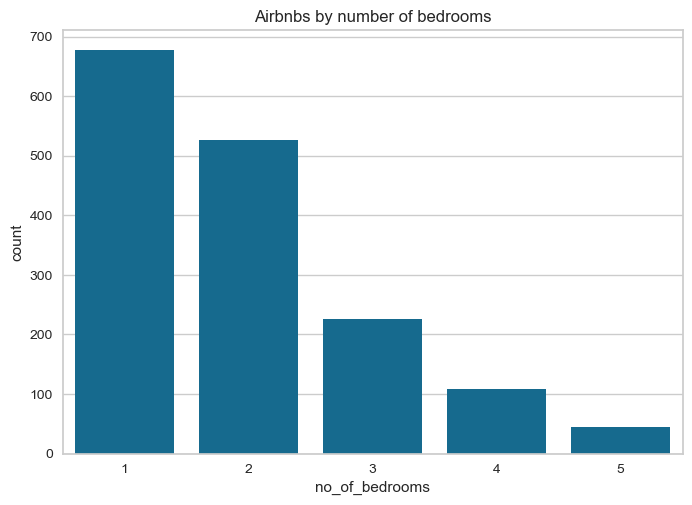

In [35]:
sns.countplot(x='no_of_bedrooms', data=entire_homes_bristol)
#plt.xticks(rotation=90)
plt.title('Airbnbs by number of bedrooms')
#rotate the x axis labels so they can be read
plt.show()

1 bedroom listings are most common. Overall, the greater the number of bedrooms, the fewer listings have that number of bedrooms.

In [36]:
entire_homes_bristol['calculated_host_listings_count'].value_counts(normalize=True)*100

1      51.706700
2      11.504425
164     8.786346
3       5.625790
61      3.792668
35      2.212389
4       2.212389
17      2.149178
30      1.896334
7       1.706700
24      1.390645
5       1.264223
16      1.011378
9       0.821745
14      0.758534
11      0.695322
12      0.632111
25      0.568900
8       0.505689
10      0.379267
6       0.379267
Name: calculated_host_listings_count, dtype: float64

In [37]:
entire_homes_bristol['calculated_host_listings_count'].value_counts()

1      818
2      182
164    139
3       89
61      60
35      35
4       35
17      34
30      30
7       27
24      22
5       20
16      16
9       13
14      12
11      11
12      10
25       9
8        8
10       6
6        6
Name: calculated_host_listings_count, dtype: int64

In [38]:
list_164 = entire_homes_bristol[entire_homes_bristol['calculated_host_listings_count'] == 164]
same_person = len(list_164[list_164['host_name'] == 'Hopewell'])
#list_164.head(20)
print(same_person)

139


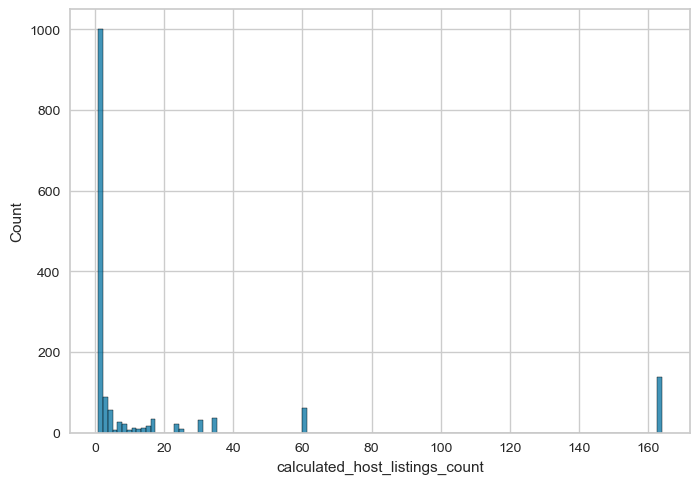

In [39]:
sns.histplot(data=entire_homes_bristol, x='calculated_host_listings_count')
plt.show()

The majority of Airbnb listings are ran by hosts with 10 listings or fewer, which is unsurprising as purchasing property in Bristol is expensive, and it's not necessarily a sole source of income for most hosts. 51.7% of entire home listings are hosetd by hosts with only one listing, meaning that nearly half of Airbnb listings in Bristol are run by hosts with more than one listing. The 139 listings where the host listing count is 164 listings are all ran by Hopewell, which is an estate agent in Bristol. 

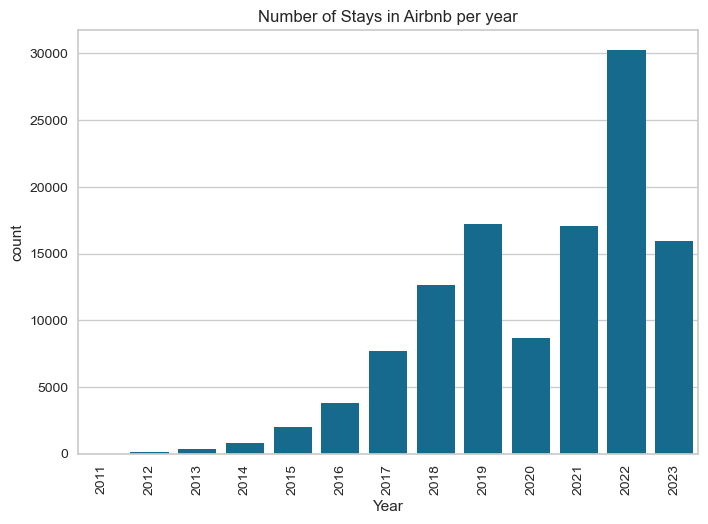

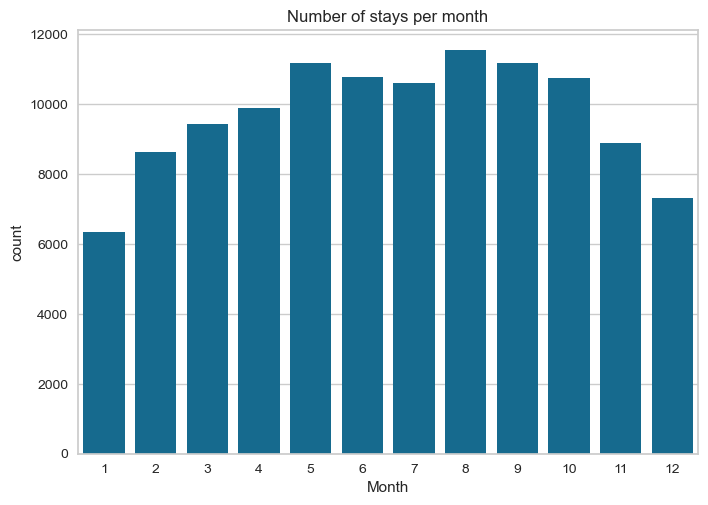

In [40]:
seasonal_stats(reviews_jun23_bristol)

Overall, there was an upwards trend of renting Airbnbs in Bristol up until 2022 based on number of reviews left, which is the current peak. The growth of Airbnb in Bristol has been exponential overall, with an expected drop in 2020 due to decreased travel due to Covid-19. Although the graph appears to show a decline for 2023, 2023 has not yet finished as a year, so 2023 may beat 2022 as the year with the highest number of Airbnb stays in Bristol.

The 3 most popular months to rent an Airbnb in Bristol are May, August, and September. January is the least popular month to rent an Airbnb in Bristol, which makes sense as people are to have limited money to spend on travel due to Christmas expenses such as buying presents and potentially travelling to see family. Anyone who may go on holiday in January is likely to look to go somewhere warm abroad rather than a trip in the UK.

In [41]:
from shapely.geometry import MultiPoint
import contextily as ctx
from contextily import providers
neighbourhoods = gpd.read_file(r'C:\Users\Florence\Documents\Data_science_projects\Airbnb_data_UK\Data\GB\district_borough_unitary_ward_region.shp')

bristol_neighbourhoods = neighbourhoods[neighbourhoods['FILE_NAME'] == 'CITY_OF_BRISTOL_(B)']
#bristol_neighbourhoods.head(34)

In [42]:
geo_list_jun23_bristol = geo_list_jun23_bristol[geo_list_jun23_bristol['no_of_bedrooms'] <= 5]

In [43]:
bristol_neighbourhoods = bristol_neighbourhoods.rename(columns={'NAME': 'neighbourhood'})
bristol_neighbourhoods['neighbourhood'] = bristol_neighbourhoods['neighbourhood'].str.replace(r'\s+Ward$', '')

In [44]:
bristol_neighbourhoods = bristol_neighbourhoods.to_crs(epsg=3857)
# Calculate the number of listings in each neighbourhood
listings_by_neighborhood = geo_list_jun23_bristol.groupby('neighbourhood').size().reset_index(name='listing_count')
listings_by_neighborhood['neighbourhood'].replace('Knowle West', 'Knowle', inplace=True)
listings_by_neighborhood['neighbourhood'].replace('St George Central', 'St. George Central', inplace=True)
listings_by_neighborhood['neighbourhood'].replace('St George Troopers Hill', 'St. George Troopers Hill', inplace=True)
listings_by_neighborhood['neighbourhood'].replace('St George West', 'St. George West', inplace=True)
bristol_neighbourhoods['neighbourhood'] = bristol_neighbourhoods['neighbourhood'].astype('string')
listings_by_neighborhood['neighbourhood'] = listings_by_neighborhood['neighbourhood'].astype('string')

In [45]:
merged_gdf = bristol_neighbourhoods.merge(listings_by_neighborhood.astype({"neighbourhood": "str"}), how='inner', on='neighbourhood')
#merged_gdf.head()

In [46]:
#Converting from longitude and latitude to Web Mercator coordinates
from pyproj import Proj, transform

P3857 = Proj(init='epsg:3857')
P4326 = Proj(init='epsg:4326')

min_long = -2.71
min_lat = 51.393786
max_long = -2.450653
max_lat = 51.567636

min_x,min_y = transform(P4326, P3857, min_long, min_lat)
max_x,max_y = transform(P4326, P3857, max_long, max_lat)

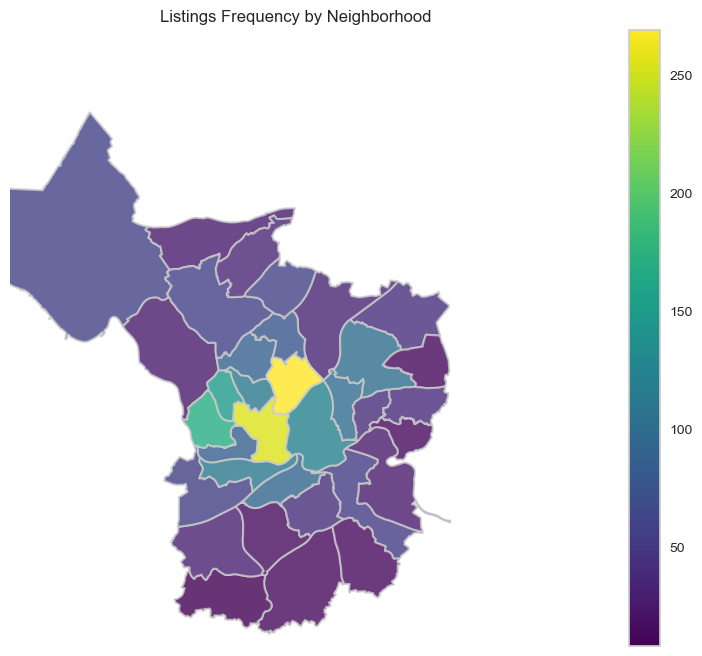

In [47]:
# Create a figure and axes
merged_gdf = merged_gdf.to_crs(epsg=3857)
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Add basemap on top
#basemap, extent = ctx.bounds2img(*merged_gdf.total_bounds, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)
#ax.imshow(basemap, extent=extent, cmap='gray', interpolation='bilinear', origin='upper', alpha=0.5)

# Plot the GeoDataFrame with adjusted alpha (less transparency)
merged_gdf.plot(column='listing_count', cmap='viridis', linewidth=1.5, ax=ax, edgecolor='0.8', alpha=0.8, legend=True)

# Set the title and axis labels
ax.set_title('Listings Frequency by Neighborhood')
ax.set_axis_off()
ax.set_xlim(min_x, max_x) #longitude limits
ax.set_ylim(min_y, max_y) #latitude limits
# Show the plot
plt.show()

From this graph, one can see that the neighbourhoods with the highest numbers of lisitngs are the closest to the center of Bristol, and the further from the centre one goes, the fewer listings there are. In fact, most neighbourhoods have under 100 listings, and several neighoburhoods have fewer than 50 listings.

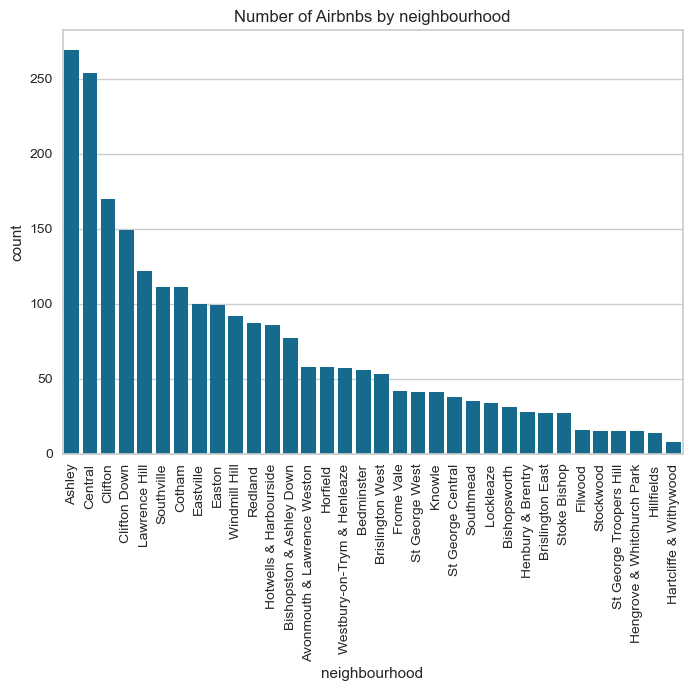

<Figure size 800x550 with 0 Axes>

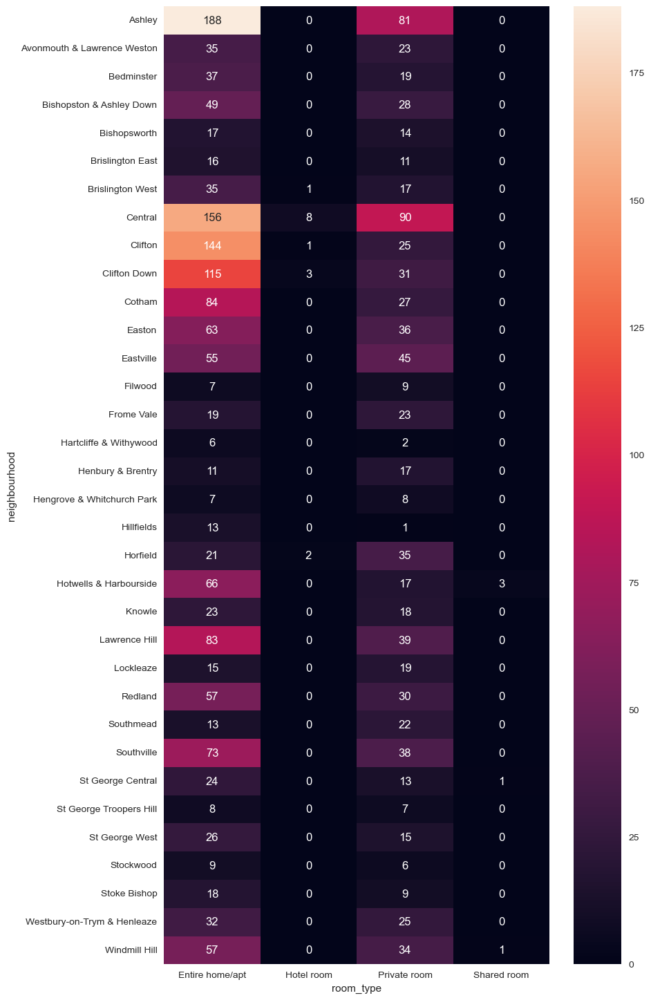

<Figure size 2500x5500 with 0 Axes>

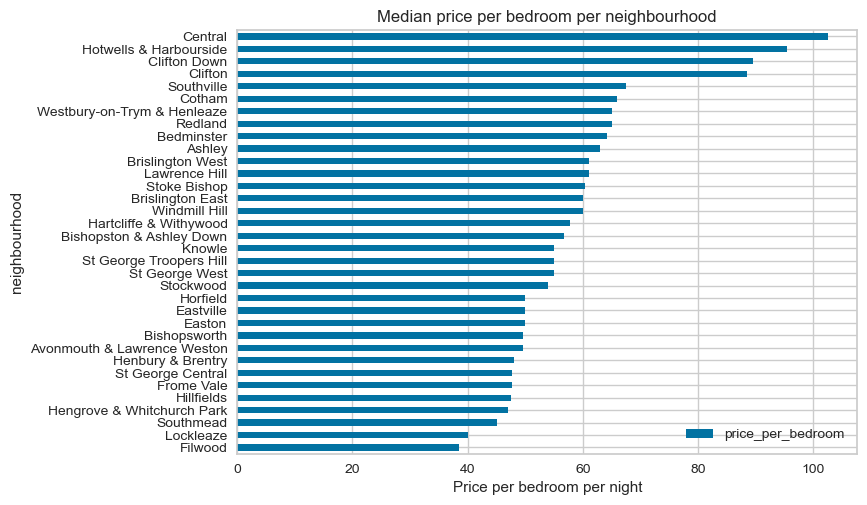

In [48]:
neighbourhood_stats(list_jun23_bristol)

The first graph shows the number of listings per neighbourhood. The three neighbourhoods with the most listings overall are: Ashley, the city centre, and Clifton. The city centre being one of the top neighbourhoods in terms of listings is unsurprising, as people will tend to prefer to stay in the city centre if they are there on holiday or only there for a short period of time. The three neigbourboods with the fewest listings are: Hillfields, Stockwood, and Hartcliffe & Withywood.

The second graph shows the frequency of each room type by neighbourhood. The frequency of hotel rooms and shared rooms is low overall, which is expected as very few are listed on Airbnb. Ashley has the highest number of Airbnbs in Bristol, being the neighbourhood with the most entire home listings at 188 entire home listings. The city centre has the most private room listings at 90 private room listings.

The third graph shows the median price per bedroom by neighbourhood; the median was chosen because the median is less vulnerable to outliers. The three neighbourhoods with the highest median price per bedroom are: the city centre, Hotwells & Harbourside, and Clifton Down. The city centre being the most expensive makes sense because customers are willing to pay more for the convience of staying in the city centre, especially considering that typically customers are staying short term. Additionally, properties in city centres tend to be more expensive to purchase. Hotwells & Harbourside and Clifton Down being the next most expensive neighbourhoods is expected as they are both very near the city centre. 

The median price for an Airbnb in the city centre is ~£104 per night per bedroom, and the median price for a hotel room is £136 per night in the city centre - this was based on looking at hotel listings in order of price and picking the median listing at the time of writing this looking at a date 2 weeks ahead; this comparison has its limitations since the Airbnb data is from June which is a more popular month compared to November. In summary, a median hotel room is significantly more expensive than a median Airbnb in the city centre, incentivising customers to choose an Airbnb rather than a hotel, especially if the amenities a hotel provides aren't important to them. 

The median price of a hotel in Hotwells & Harbourside is £133 per night using the same conditions as earlier, which is significantly more expensive than ~£95 per bedroom per night, which again incentivises customers to pick an Airbnb over a hotel, assuming that the prices listed either include any cleaning fees or the additional cleaning fees are relatively low.

Overall, median hotel prices appear to be more expensive in Bristol than median prices per bedroom for Airbnbs, which especially considering high living costs and inflation, means that people would be incentivised from a financial perspective to choose to stay in an Airbnb over a hotel, and the financial incentive to stay in an Airbnb over a hotel is even stronger if one is travelling as a family or as a group. Additionally, there's the possibility of being able to cook food in an Airbnb unlike most hotels.

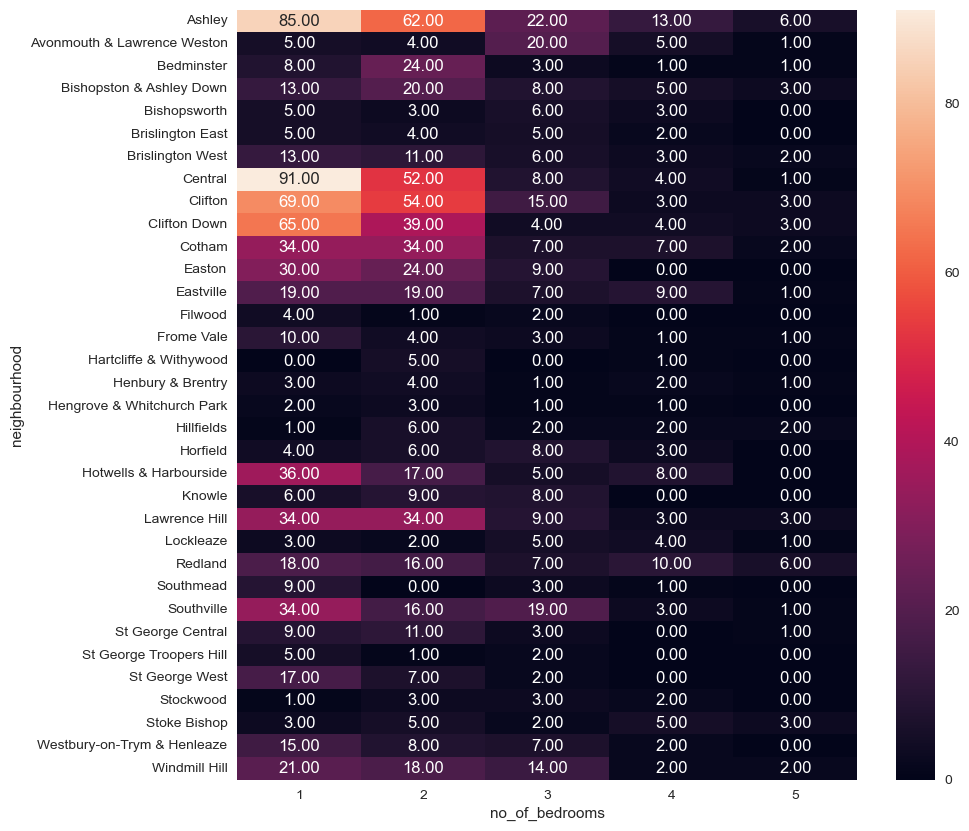

In [49]:
plt.figure(figsize=(10, 10))
sns.heatmap(pd.crosstab(index = entire_homes_bristol['neighbourhood'], columns = entire_homes_bristol['no_of_bedrooms']), annot=True, fmt='.2f')
plt.show()

The vast majority of listings are 1-2 bedrooms, suggesting that most listings are likely flats rather than houses. This means that the impact on the long term rental market of Airbnb in Bristol is likely to predominately be felt by young working professionals who don't have children or elderly people rather than families with children living at home. 

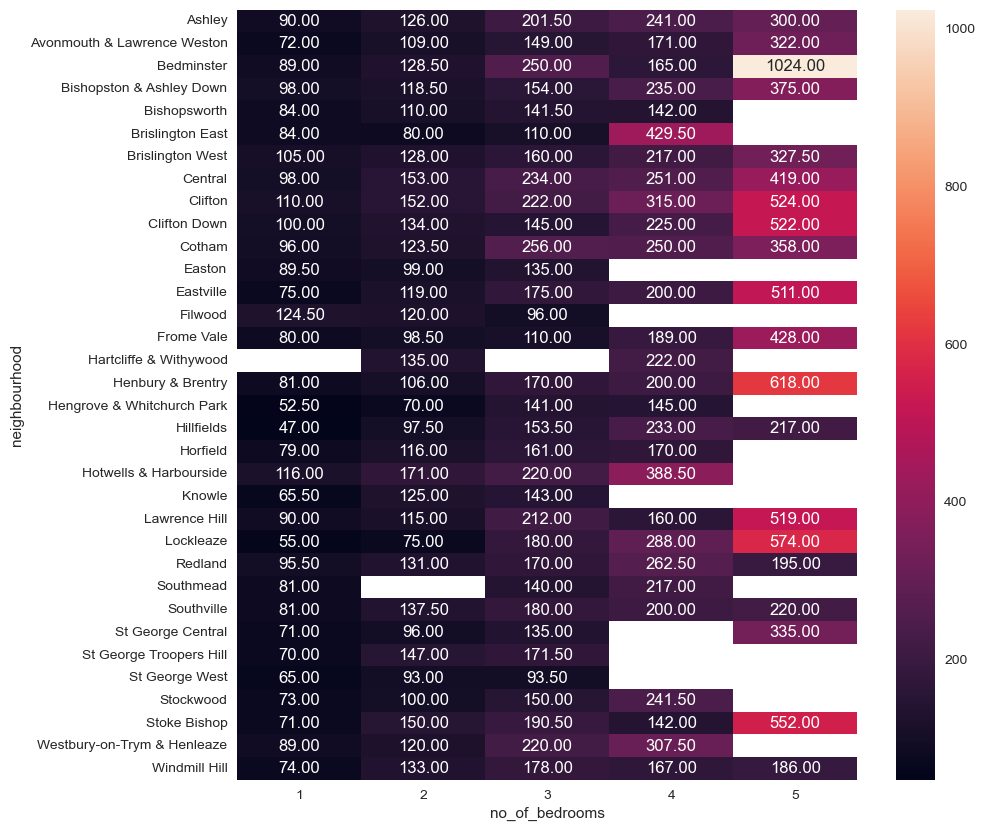

In [50]:
median_prices = entire_homes_bristol.groupby(['neighbourhood', 'no_of_bedrooms'])['price'].median().reset_index()
heatmap_prices = median_prices.pivot('neighbourhood', 'no_of_bedrooms', 'price')
plt.figure(figsize=(10, 10))
sns.heatmap(heatmap_prices, annot=True, fmt='.2f')
plt.show()

Overall, the median price increases as the number of bedrooms increases for most neighbourhoods though not all; for example in Redland, the median price for a 5 bedroom listing is lower than for a 4 bedroom listing. Despite the city centre having the highest median price per bedroom, it doesn't have the highest median price for any number of bedrooms. This may be due to the graph showing price per bedroom per neighbourhod using data that included listings that were private rooms, unlike the graph above. It is also useful to note that not all properties of a given number of bedrooms are similar in the size of the bedrooms or how well kept the overall property is. The blanks in the above graph are due to a given neighbourhood not having any properties with that number of bedrooms.

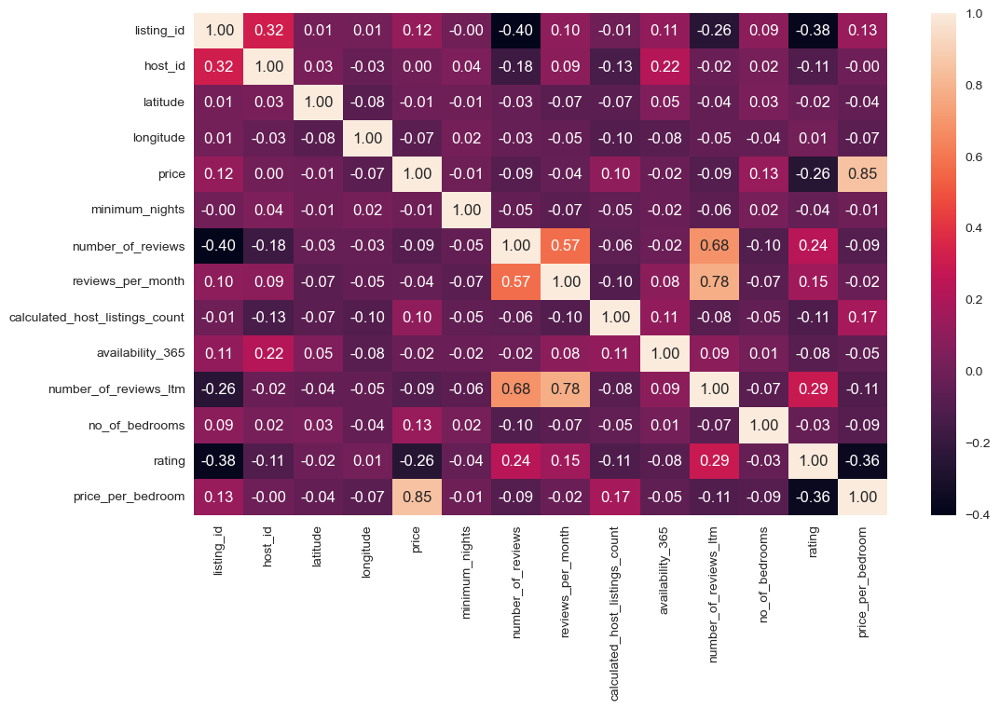

In [51]:
correlation_map(list_jun23_bristol)

Generally, there aren't many variables that have especially strong correlations except variables that are derived from each other, such as `price` and `price_per_bedroom`. The correlation between the number of bedrooms and price is a weak positive correlation, having a correlation coefficient of 0.13. One may expect the correlation between price and number of bedrooms to be stronger, especially considering that the greater the number of bedrooms, the more guests can stay at your Airbnb and also the higher the running costs of that Airbnb, such as council tax, utilities, and also the purchase of the property itself, unless it's also your home. However, there are various factors that could contribute to the price of a Airbnb, such as the neighbourhood it's located in.

In [52]:
price_by_room_type = pd.pivot_table(list_jun23_bristol, values=['price'], index=['room_type'], aggfunc=np.median)

price_by_room_type.head()

,price
room_type,
Entire home/apt,119
Hotel room,91
Private room,48
Shared room,28


## Checking outliers and preprocessing data for price prediction

In [53]:
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2436 entries, 0 to 2463
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2436 non-null   int64         
 1   name                            2436 non-null   object        
 2   host_id                         2436 non-null   int64         
 3   host_name                       2436 non-null   object        
 4   neighbourhood                   2436 non-null   object        
 5   latitude                        2436 non-null   float64       
 6   longitude                       2436 non-null   float64       
 7   room_type                       2436 non-null   object        
 8   price                           2436 non-null   int64         
 9   minimum_nights                  2436 non-null   int64         
 10  number_of_reviews               2436 non-null   int64         
 11  last

In [54]:
oldest_review = list_jun23_bristol['last_review'].min()
newest_review = list_jun23_bristol['last_review'].max()
print("This is the oldest review:", oldest_review)
print("This is the newest review:", newest_review)

This is the oldest review: 2015-09-05 00:00:00
This is the newest review: 2023-06-26 00:00:00


In [55]:
no_last_review = list_jun23_bristol[list_jun23_bristol['last_review'].isnull()]
no_last_review.tail()

,listing_id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,no_of_bedrooms,rating,price_per_bedroom
2459,920964743555205701,Home in Brislington · ★New · 1 bedroom · 1 bed...,520468090,Parth,Brislington West,51.439981,-2.559135,Entire home/apt,76,1,0,NaT,NaN,4,267,0,1,0.0,76.0
2460,920966654182530248,Rental unit in Bristol City · ★New · 1 bedroom...,520468090,Parth,Central,51.450226,-2.595459,Private room,56,1,0,NaT,NaN,4,268,0,1,0.0,56.0
2461,920968810394210522,Rental unit in Bristol · ★New · 1 bedroom · 1 ...,520468090,Parth,Henbury & Brentry,51.509000,-2.617235,Private room,120,1,0,NaT,NaN,4,269,0,1,0.0,120.0
2462,921488105488952157,Home in Totterdown · ★New · 2 bedrooms · 2 bed...,154152507,Prescott Apartments,Windmill Hill,51.443684,-2.578962,Entire home/apt,138,2,0,NaT,NaN,14,90,0,2,0.0,69.0
2463,922254821006438019,Home in Ashley Down · ★New · 2 bedrooms · 3 be...,5238671,Kris,Bishopston & Ashley Down,51.481188,-2.581742,Entire home/apt,108,3,0,NaT,NaN,1,222,0,2,0.0,54.0


There are still some null values in `last_review` and `reviews_per_month`; null values make up 14.3\% of data in each of those columns. Not all listings that have null values in these columns is marked as a new listing, though considering that they have no last review date and also have no reviews, no one has yet stayed at these Airbnbs. I'll remove rows with null values in these columns because I'm going to use Airbnbs that have at least 1 review for price prediction, as that indicates that likely at least one guest has stayed there, suggesting that the price does at least somewhat reflect market value. 

In [56]:
#Dropping rows where the last review column has a null value

list_jun23_bristol.dropna(inplace=True)

In [57]:
list_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2095 entries, 0 to 2450
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      2095 non-null   int64         
 1   name                            2095 non-null   object        
 2   host_id                         2095 non-null   int64         
 3   host_name                       2095 non-null   object        
 4   neighbourhood                   2095 non-null   object        
 5   latitude                        2095 non-null   float64       
 6   longitude                       2095 non-null   float64       
 7   room_type                       2095 non-null   object        
 8   price                           2095 non-null   int64         
 9   minimum_nights                  2095 non-null   int64         
 10  number_of_reviews               2095 non-null   int64         
 11  last

In [58]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

def VIF_test(dataframe):
    # Add a constant term to the data (intercept)
    data_with_const = add_constant(dataframe)
    numeric_data = data_with_const.select_dtypes(include=['number'])

    # Create a DataFrame to store the VIF values
    vif_data = pd.DataFrame()

    # Calculate VIF for each feature
    vif_data["Variable"] = numeric_data.columns
    vif_data["VIF"] = [variance_inflation_factor(numeric_data.values, i) for i in range(numeric_data.shape[1])]

    # Display the VIF values
    print(vif_data)

In [59]:
VIF_test(list_jun23_bristol)

                          Variable           VIF
0                            const  0.000000e+00
1                       listing_id  1.541611e+00
2                          host_id  8.053636e-01
3                         latitude  2.577102e-07
4                        longitude  2.419681e-04
5                            price  9.398465e-01
6                   minimum_nights  9.919213e-01
7                number_of_reviews  7.865873e-01
8                reviews_per_month  7.457243e-01
9   calculated_host_listings_count  9.040759e-01
10                availability_365  7.200229e-01
11           number_of_reviews_ltm  7.699443e-01
12                  no_of_bedrooms  4.531628e-01
13                          rating  7.710394e-03
14               price_per_bedroom  8.258035e-01


The variables listed all have a VIF value of 1 or under, meaning that the price prediction model won't have multicollinearity; however, this doesn't account for multicollinearity between variables such as latitude and longitude with neighbourhoods.

In [60]:
#Dropping every review column other than number of reviews, as that seems to be the be the most relevant and most of the other review columns are very closely correlated with that column
#Also dropping other variables that are either not relevant or they also cause multicollinearity
list_jun23_bristol_no_name = list_jun23_bristol.drop(columns=['last_review', 'reviews_per_month', 'number_of_reviews_ltm','name', 'price_per_bedroom', 'host_name', 'longitude', 'latitude', 'listing_id', 'host_id'])#dropping most of the review based columns to reduce the chance of multicollinearity
list_jun23_bristol_no_name.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2095 entries, 0 to 2450
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood                   2095 non-null   object 
 1   room_type                       2095 non-null   object 
 2   price                           2095 non-null   int64  
 3   minimum_nights                  2095 non-null   int64  
 4   number_of_reviews               2095 non-null   int64  
 5   calculated_host_listings_count  2095 non-null   int64  
 6   availability_365                2095 non-null   int64  
 7   no_of_bedrooms                  2095 non-null   int64  
 8   rating                          2095 non-null   float64
dtypes: float64(1), int64(6), object(2)
memory usage: 163.7+ KB


In [61]:
list_jun23_bristol_no_name['minimum_nights'].value_counts()

1      862
2      773
3      205
4       82
5       62
7       36
14      16
6       13
30      11
28       7
10       4
31       2
21       2
20       2
365      2
90       1
120      1
15       1
95       1
110      1
200      1
22       1
40       1
9        1
500      1
45       1
25       1
32       1
29       1
100      1
300      1
Name: minimum_nights, dtype: int64

In [62]:
VIF_test(list_jun23_bristol_no_name)

                         Variable         VIF
0                           const  346.642854
1                           price    1.073943
2                  minimum_nights    1.004930
3               number_of_reviews    1.025491
4  calculated_host_listings_count    1.146269
5                availability_365    1.054266
6                  no_of_bedrooms    1.087431
7                          rating    1.191203


The variables remaining have a variance inflation factor of 1, indicating that the price regression model won't have multicollinearity.

In [63]:
from pycaret.datasets import get_data

#Splitting the data into seen data and completely unseen data; the seen data will be used to determine the price prediction model
list_jun23_bristol_no_name_data = list_jun23_bristol_no_name.sample(frac=0.8, random_state=786, replace=False)
list_jun23_bristol_no_name_unseen = list_jun23_bristol_no_name.drop(list_jun23_bristol_no_name_data.index).reset_index(drop=True)

print(list_jun23_bristol_no_name_data.shape)
print(list_jun23_bristol_no_name_unseen.shape)

(1676, 9)
(419, 9)


## Price prediction

In [64]:
from pycaret.regression import *
s = setup(data = list_jun23_bristol_no_name_data, target = 'price', session_id = 3)

# compare baseline models
best = compare_models()

,Description,Value
0,Session id,3
1,Target,price
2,Target type,Regression
3,Original data shape,"(1676, 9)"
4,Transformed data shape,"(1676, 12)"
5,Transformed train set shape,"(1173, 12)"
6,Transformed test set shape,"(503, 12)"
7,Numeric features,6
8,Categorical features,2
9,Preprocess,True


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
huber,Huber Regressor,42.5054,113019.7289,160.9873,0.4265,0.4060,0.2941,4.6450
llar,Lasso Least Angle Regression,55.9950,116255.2960,180.2836,0.0023,0.5856,0.6414,5.1550
dummy,Dummy Regressor,68.3083,117591.1744,183.5559,-0.0331,0.7071,0.8218,4.5510
ada,AdaBoost Regressor,73.8503,116142.0368,181.1244,-0.0491,0.6952,0.9121,4.5330
par,Passive Aggressive Regressor,76.0011,118913.1603,195.6980,-0.3955,0.8201,0.8053,5.7090
lasso,Lasso Regression,60.7557,119087.4673,197.1686,-0.4853,0.7238,0.6295,5.0940
ridge,Ridge Regression,61.1851,119085.7864,197.3185,-0.4894,0.7361,0.6325,7.2300
lr,Linear Regression,61.2100,119085.9280,197.3305,-0.4897,0.7372,0.6327,7.2750
lar,Least Angle Regression,61.2122,119085.9415,197.3305,-0.4897,0.7372,0.6327,4.9270
en,Elastic Net,60.1525,120036.8078,198.8379,-0.5334,0.6580,0.6557,5.9190


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [65]:
huber = create_model('huber')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,129.6921,1092663.0003,1045.3052,0.0018,0.5503,0.2622
1,27.7460,2167.0820,46.5519,0.4883,0.3763,0.2726
2,38.3419,5533.9199,74.3903,0.4289,0.4071,0.2940
3,34.7035,6649.7675,81.5461,0.4037,0.3695,0.3119
4,33.7000,4322.1946,65.7434,0.4667,0.4129,0.2810
5,28.4464,1819.9478,42.6608,0.5773,0.3824,0.3096
6,28.7029,2600.9523,50.9995,0.4783,0.4202,0.3373
7,31.5556,2628.5138,51.2690,0.5373,0.3613,0.2874
8,33.7315,3903.3037,62.4764,0.5576,0.3583,0.2904


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [66]:
tuned_huber = tune_model(huber)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,129.7448,1092688.7835,1045.3176,0.0018,0.5489,0.2662
1,27.9959,2150.5995,46.3746,0.4922,0.3762,0.2800
2,38.3245,5446.8236,73.8026,0.4379,0.4065,0.3012
3,34.4021,6548.5220,80.9229,0.4127,0.3651,0.3097
4,33.5314,4279.4351,65.4174,0.4720,0.4105,0.2795
5,28.5751,1817.6985,42.6345,0.5778,0.3851,0.3153
6,28.6059,2537.6752,50.3753,0.4910,0.4474,0.3379
7,31.7876,2605.4613,51.0437,0.5414,0.3640,0.2967
8,33.2896,3813.8080,61.7560,0.5678,0.3505,0.2852


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


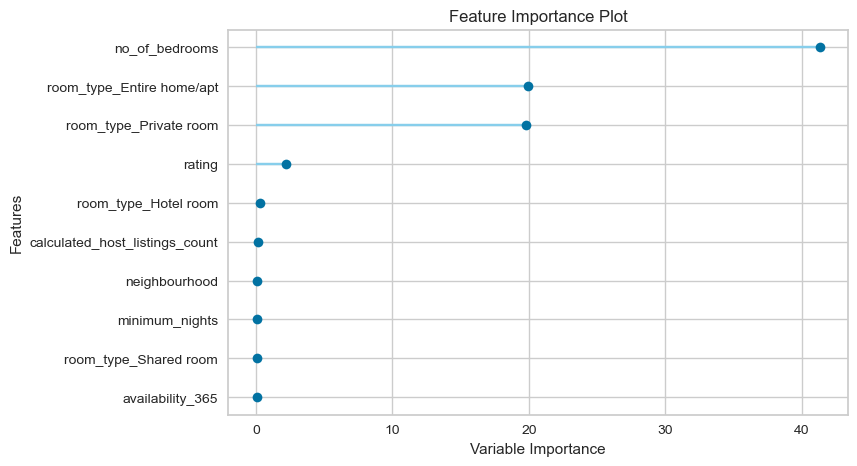

In [67]:
plot_model(tuned_huber, plot='feature')

The most important factor that appears to determine Airbnb prices in Bristol is the number of bedrooms, which is expected, as the greater the number of bedrooms, the more people can potentially stay at the property, enabling hosts to charge higher prices. Furthermore, the majority of listings in Bristol are 1-2 bedroom places, so due to there being relatively few places with 3 bedrooms or more, there is limited supply, which depending on demand, may push prices up for places with more bedrooms. 

The type of listing being an entire home or being a private room seem to be the next most important factor in determining the price of an Airbnb listing in Bristol. The median price for an entire home in Bristol overall is £119 per night compared to £48 per night for a private room, which makes sense, as in an entire home you typically have more space and there's greater privacy; considering both this fact and the fact that the main type of listing that has an impact on the private market, Bristol City Council may want to consider policies targeted towards listings that are entire homes. 

Which neighbourhood the Airbnb listing is in does not appear to influence the pricing of an Airbnb, although as we saw in a previous graph, the neighbourhoods with the highest median price per bedroom were the city centre and two neighbourhoods right next to the city, suggesting that although neighbourhood may influence the price per bedroom, that doesn't necessarily fully lead to neighbourhood being an important factor in overall prices. The fact that which neighbourhood a listing is in doesn't appear to be an important influence suggests that no one neighbourhood is more impacted by Airbnb than other neighbourhoods; therefore when making policies surrounding Airbnb in Bristol, specific policies for specific neighbourhoods aren't necessary, though to make a final decision on whether or not to have policies focused on specific neighbourhoods, it would be useful to carry out a sentiment across neighbourhoods.

## Preprocessing the data for growth forecast

In this section I will preprocess the data to prepare the data for forecasting models. Fundamentally, will Airbnb continue to grow in Bristol, and if so, what will that growth look like? In order to forecast the growth of Airbnb in Bristol, we will be using time-series modelling. Growth in this scenario will be based on demand for Airbnbs, which is measured by the number of reviews left, as when one stays in an Airbnb, one is strongly encouraged to leave a review after staying, so the number of reviews is a good indication of the amount of people staying in Airbnbs. 

In [68]:
reviews_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116577 entries, 0 to 116576
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   listing_id  116577 non-null  int64         
 1   date        116577 non-null  datetime64[ns]
 2   Year        116577 non-null  int64         
 3   Month       116577 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 3.6 MB


In [69]:
reviews_jun23_bristol['Year'].value_counts()

2022    30223
2019    17231
2021    17090
2023    15921
2018    12647
2020     8643
2017     7714
2016     3825
2015     2031
2014      804
2013      321
2012      115
2011       12
Name: Year, dtype: int64

In [70]:
reviews_jun23_bristol.tail(10)

,listing_id,date,Year,Month
116567,912219986544952439,2023-06-21,2023,6
116568,912329634946507909,2023-06-21,2023,6
116569,912329634946507909,2023-06-23,2023,6
116570,912329634946507909,2023-06-25,2023,6
116571,913215602558635609,2023-06-17,2023,6
116572,913215602558635609,2023-06-21,2023,6
116573,914222270157324022,2023-06-26,2023,6
116574,916442538991661159,2023-06-22,2023,6
116575,916442538991661159,2023-06-24,2023,6
116576,916442538991661159,2023-06-25,2023,6


In [71]:
reviews_jun23_bristol['month_and_year'] = pd.to_datetime(reviews_jun23_bristol['date']).dt.strftime('%Y-%m')
#putting the month and year together for indexing purposes

reviews_jun23_bristol.head()

,listing_id,date,Year,Month,month_and_year
0,70820,2013-10-18,2013,10,2013-10
1,70820,2013-10-28,2013,10,2013-10
2,70820,2013-11-12,2013,11,2013-11
3,70820,2014-05-17,2014,5,2014-05
4,70820,2014-06-15,2014,6,2014-06


In [72]:
reviews_jun23_bristol['month_and_year'] = pd.to_datetime(reviews_jun23_bristol['month_and_year'])

In [73]:
reviews_jun23_bristol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116577 entries, 0 to 116576
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   listing_id      116577 non-null  int64         
 1   date            116577 non-null  datetime64[ns]
 2   Year            116577 non-null  int64         
 3   Month           116577 non-null  int64         
 4   month_and_year  116577 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(3)
memory usage: 4.4 MB


In [74]:
num_of_stays = reviews_jun23_bristol['month_and_year'].value_counts() #this gives the number of stays per year and month

print(num_of_stays)

2023-05-01    3406
2022-07-01    3303
2022-08-01    3060
2023-04-01    3057
2022-09-01    3045
              ... 
2011-11-01       3
2011-08-01       3
2011-10-01       2
2011-09-01       2
2011-07-01       2
Name: month_and_year, Length: 141, dtype: int64


In [75]:
month_and_year = reviews_jun23_bristol['month_and_year'].unique()
month_and_year = pd.Series(month_and_year)
month_and_year.sort_values(inplace=True) #This sorts the dates in chronological order, as the dates are the values, not the index
month_and_year = pd.DataFrame(month_and_year)
month_and_year = month_and_year.rename(columns={0: 'month_and_year'})
month_and_year.head()
#month_and_year.info()
#month_and_year.set_index('month_and_year')

,month_and_year
72,2011-07-01
73,2011-08-01
74,2011-09-01
75,2011-10-01
76,2011-11-01


In [76]:
num_of_stays = pd.DataFrame(num_of_stays)
num_of_stays.sort_index(inplace=True) #This sorts the data in chronological order from earliest to latest
num_of_stays = num_of_stays.rename(columns={'month_and_year': 'num_of_stays'})
num_of_stays.head()
#num_of_stays.columns
#num_of_stays.info()

,num_of_stays
2011-07-01,2
2011-08-01,3
2011-09-01,2
2011-10-01,2
2011-11-01,3


In [77]:
num_of_stays_by_month = month_and_year.merge(num_of_stays, left_on='month_and_year',right_index=True)
#type(num_of_stays_df)
num_of_stays_by_month.tail()
num_of_stays.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 141 entries, 2011-07-01 to 2023-06-01
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   num_of_stays  141 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


Based on the number of values in the month and year columns being 141 rather than 144, there must be 3 months where no one was staying in Airbnbs in Bristol. In order to ensure no missing months, I will resample the `num_of_stays_by_month` dataframe to fill in those gaps.

In [78]:
#setting month and year as the index for the dataframe

num_of_stays_by_month = num_of_stays_by_month.set_index('month_and_year')
num_of_stays_by_month.index = pd.to_datetime(num_of_stays_by_month.index)
freq='M'
num_of_stays_by_month = num_of_stays_by_month.resample(freq).sum()
num_of_stays_by_month.head()

,num_of_stays
month_and_year,
2011-07-31,2
2011-08-31,3
2011-09-30,2
2011-10-31,2
2011-11-30,3


In [79]:
num_of_stays_by_month.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 2011-07-31 to 2023-06-30
Freq: M
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   num_of_stays  144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


## Time series forecasting

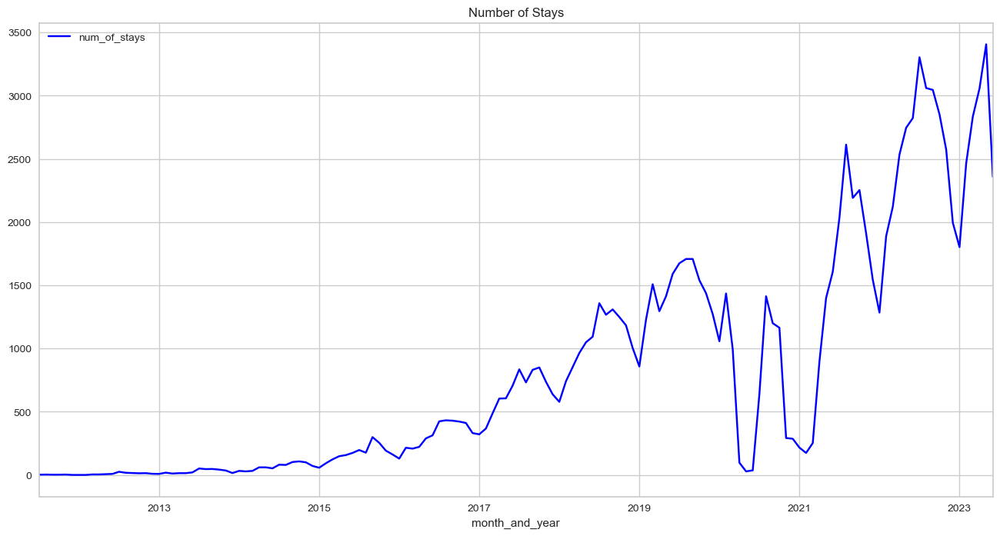

In [80]:
ax = num_of_stays_by_month.plot(color = 'blue', figsize = (16, 8))

ax.set_title('Number of Stays')

plt.show()

Overall, the number of stays on Airbnb appears to be trending exponentially in Bristol. There was a huge drop in 2020 due to the Covid-19 pandemic. There appears to be some seasonality, but that will be more easily told when breaking down the data into trend, seasonality, and noise.

In [81]:
#Decomposing the data into trend, seasonality, and white noise

decompose = sm.tsa.seasonal_decompose(num_of_stays_by_month)

trend = decompose.trend
seasonality = decompose.seasonal
white_noise = decompose.resid

Text(0.5, 1.0, 'White noise')

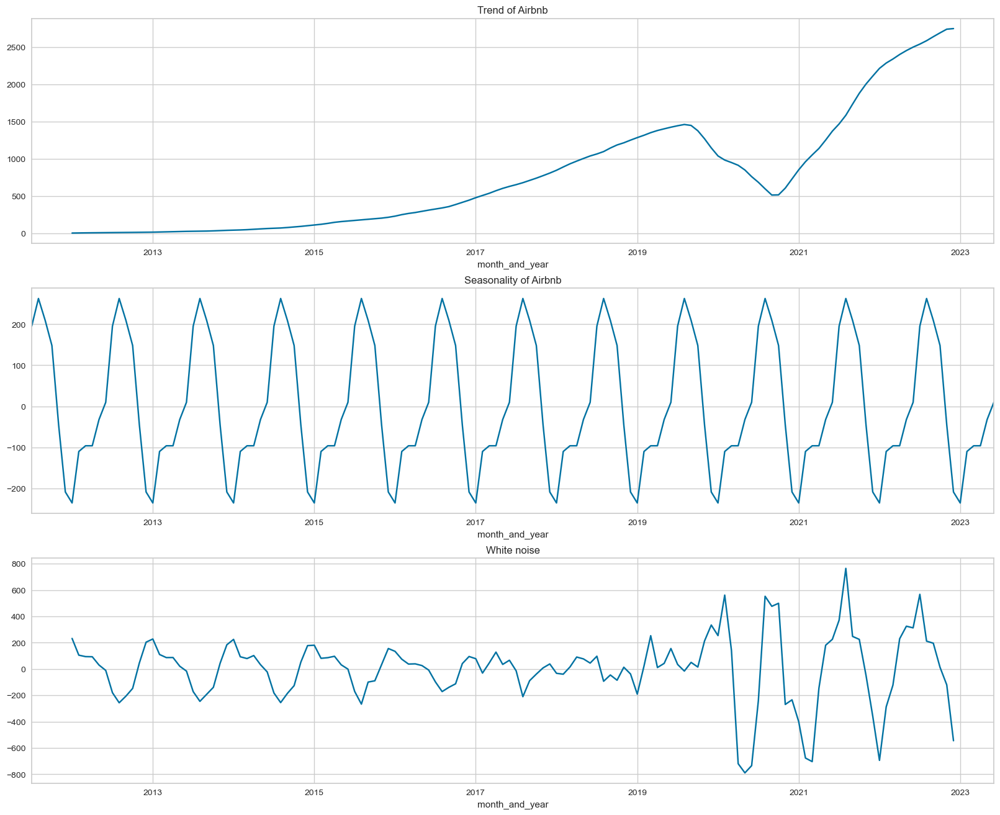

In [82]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 3, ncols = 1, figsize = (20, 16))

trend.plot(ax=ax1)
ax1.set_title('Trend of Airbnb')
seasonality.plot(ax=ax2)
ax2.set_title('Seasonality of Airbnb')
white_noise.plot(ax=ax3)
ax3.set_title('White noise')

Overall, there is a trend going upwards, and there is also seasonality, which is expected considering that this data is on a monthly frequency. There is also some residual noise, which is more extreme after 2020.

In [83]:
#Splitting the data into test and train data
#We will take data from July 2020 to June 2023 to be our test data; this will result in a roughly 75% training data and 25% test data split

num_stays_by_mth_train = num_of_stays_by_month.loc['2011-07-31':'2020-07-31']
num_stays_by_mth_test = num_of_stays_by_month.loc['2020-07-31':]
#print(len(num_stays_by_mth_train))
#print(len(num_stays_by_mth_test))

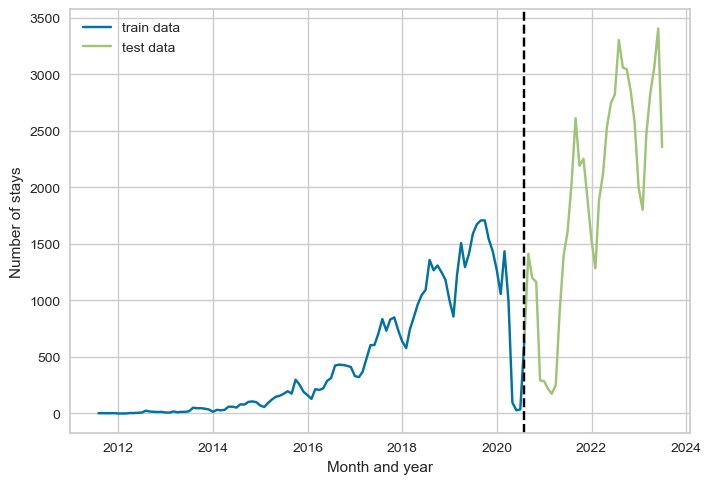

In [84]:
plt.plot(num_stays_by_mth_train)
plt.plot(num_stays_by_mth_test)
plt.xlabel('Month and year')
plt.ylabel('Number of stays')
plt.legend(['train data', 'test data'])
plt.axvline(x=num_stays_by_mth_test.index[0], color='black', linestyle='--')
plt.show()

#### Testing stationarity

In order to model a time series, it needs to have stationarity; the data can be transformed to have stationarity if the data does not already have stationarity. We will test for stationarity using the Augumented Dicky-Fuller test. 

The null hypothesis here is that the time series is not stationary. The alternative hypothesis is that the time series is stationary.

In [85]:
from statsmodels.tsa.stattools import adfuller

def ADFuller(data_table):
    result = adfuller(data_table['num_of_stays'])
    print("ADF Statistic:", result[0])
    print("p-value is:", result[1])
    print("Critical values are:", result[4])

In [86]:
ADFuller(num_stays_by_mth_train)

ADF Statistic: -0.8629375559650124
p-value is: 0.7999325416800329
Critical values are: {'1%': -3.5011373281819504, '5%': -2.8924800524857854, '10%': -2.5832749307479226}


The p-value is significantly greater than 0.05, and the ADF value is much greater than any of the critical values, therefore we fail to reject the null hypothesis and this time series is therefore not stationary.

#### Making the series stationary

In [87]:
#Taking the first order difference and testing stationarity

num_stays_by_mth_train_stationary = num_stays_by_mth_train.diff().dropna()

ADFuller(num_stays_by_mth_train_stationary)

ADF Statistic: -2.1596458118385615
p-value is: 0.22121619104895596
Critical values are: {'1%': -3.5011373281819504, '5%': -2.8924800524857854, '10%': -2.5832749307479226}


After taking the first difference, the series is still not stationary as p is greater than 0.05 and the ADF value is greater than any of the critical values.

In [88]:
#Taking the second order difference

num_stays_by_mth_train_stationary_2 = num_stays_by_mth_train.diff().diff().dropna()

ADFuller(num_stays_by_mth_train_stationary_2)

ADF Statistic: -4.603717879930771
p-value is: 0.0001271467610227064
Critical values are: {'1%': -3.5011373281819504, '5%': -2.8924800524857854, '10%': -2.5832749307479226}


The series is now stationary after taking the second difference, as p is much smaller than 0.05, and the ADF value is smaller then any of the critical values. The number of times of differencing it takes for a time series is known as the integration parameter (represented by d). Here, d=2.

## Determining the most accurate time series model

We are going to test 5 different types of time series model. These are:

1. Autoregressive (AR)
2. Moving Average (MA)
3. Autoregressive Moving Average (ARMA)
4. Autoregressive Integrated Moving Average (ARIMA)
5. Seasonal Autoregressive Integrated Moving Average (SARIMA)

We are also going to see what models Auto ARIMA and pycaret recommend.

### ACF and PACF plots

Now that we have a stationary time-series for the number of stays within a month and year, we will plot the autocorrelation function (ACF) and the partial autocorrelation function (PACF). These plots will help to determine the parameters `p` and `q`.

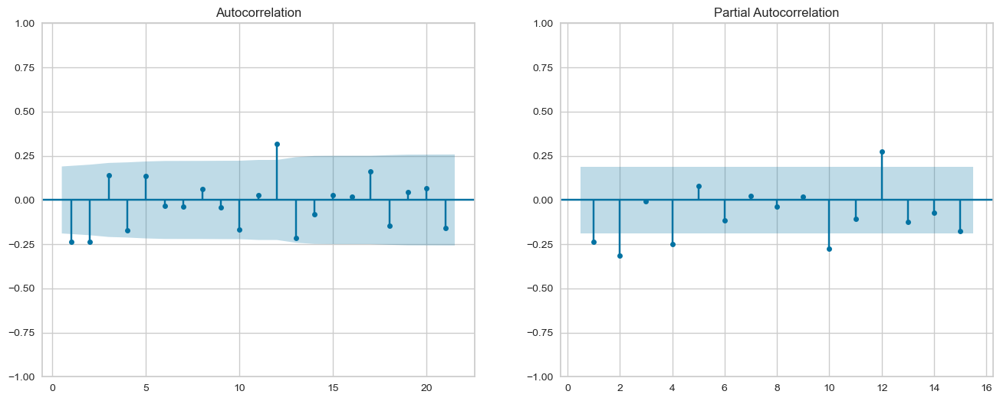

In [89]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (16, 6))

tsaplots.plot_acf(num_stays_by_mth_train_stationary_2, zero=False, ax=ax1)
tsaplots.plot_pacf(num_stays_by_mth_train_stationary_2, zero=False, ax=ax2, lags=15)
plt.show()

Neither the ACF nor the PACF appear to follow a consistent pattern in terms of the points outside the boundary. The highest lag that is outside the boundary is lag 12. For the PACF, the lags that appear outside the boundary are: 1, 2, 4, 10, and 12. The lags that appear outside the boundary for the ACF are: 1, 2, and 12.

### AR Model

We will build 4 AR models at lags 1, 2, 3, and 4.

In [90]:
from statsmodels.tsa.ar_model import AutoReg

ar1_model = AutoReg(num_stays_by_mth_train_stationary_2, lags=1) #p=1
ar2_model = AutoReg(num_stays_by_mth_train_stationary_2, lags=2) #p=2
ar3_model = AutoReg(num_stays_by_mth_train_stationary_2, lags=3) #p=3
ar4_model = AutoReg(num_stays_by_mth_train_stationary_2, lags=4) #p=4

In [91]:
ar1_result = ar1_model.fit()
ar2_result = ar2_model.fit()
ar3_result = ar3_model.fit()
ar4_result = ar4_model.fit()

In [92]:
from sklearn.metrics import mean_squared_error

def plot_predictions(results, ax):

    # We are taking double cumulative sum of forecasted values (which is inverse of double differencing)
    # And we are also adding the last element of the training data to the forecasted values to get back to the original scale
    predict = np.cumsum(np.cumsum(results.predict(start = num_stays_by_mth_test.index[0], end = num_stays_by_mth_test.index[-1]))) + num_stays_by_mth_train.iloc[-1][0]
    predict.index = num_stays_by_mth_test.index
    
    num_stays_by_mth_train.plot(ax = ax, label = 'train', title = 'AIC: {}'.format(np.round(results.aic, 2)) + ' , ' + 'RMSE: {}'.format(np.round(np.sqrt(mean_squared_error(num_stays_by_mth_test, predict)), 2)))
    
    num_stays_by_mth_test.plot(ax=ax)
    predict.plot(ax=ax)
    ax.legend(['train data', 'test data', 'forecasted values'])

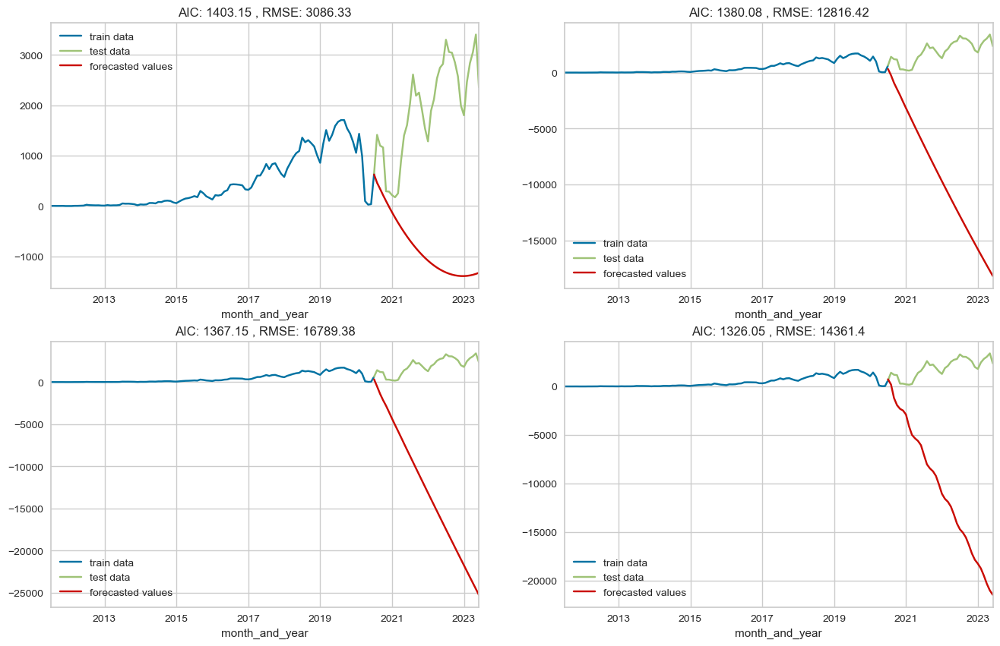

In [93]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (16, 10))

plot_predictions(ar1_result, ax1)

plot_predictions(ar2_result, ax2)

plot_predictions(ar3_result, ax3)

plot_predictions(ar4_result, ax4)
plt.show()

The AIC for all the AR models is relatively similar, but the root mean squared error is lowest for an AR(1) model, so we may want to use p=1 for ARMA/ARIMA modelling, though none of the autoregression models fit the data well as the dips in 2020 and 2021 were temporary dips rather than a permanent downard trend. Additionally, autoregression models also don't acknowledge seasonality.

### MA Model

In [94]:
ma1_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(0,0,1)) #q=1
ma2_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(0,0,2)) #q=2
ma3_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(0,0,3)) #q=3
ma4_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(0,0,4)) #q=4

In [95]:
ma1_result = ma1_model.fit()
ma2_result = ma2_model.fit()
ma3_result = ma3_model.fit()
ma4_result = ma4_model.fit()

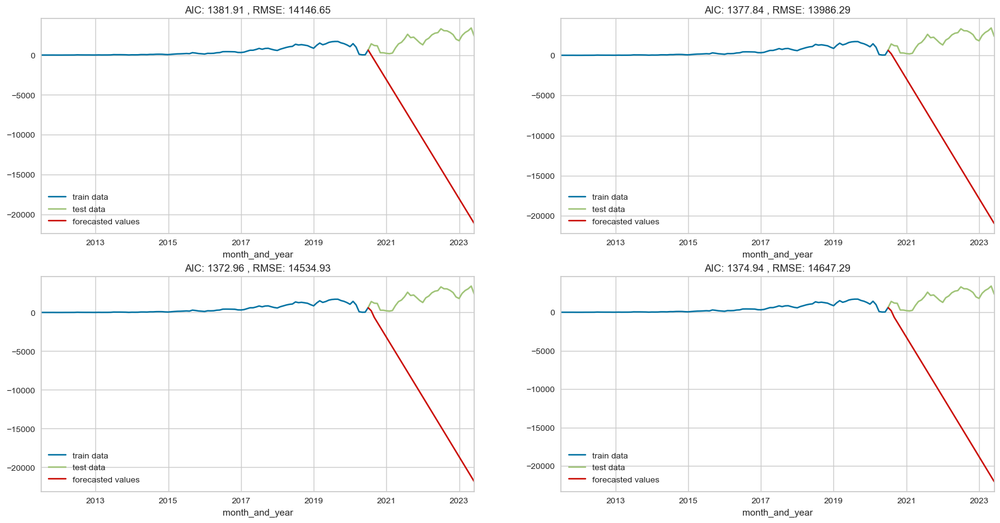

In [96]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 10))

plot_predictions(ma1_result, ax1)

plot_predictions(ma2_result, ax2)

plot_predictions(ma3_result, ax3)

plot_predictions(ma4_result, ax4)
plt.show()

A moving average model doesn't fit the data well, as the RSME is very high for all MA models. Autoregression seems to fit the behaviour of the data better than a moving average.

### ARMA Model

In [97]:
arma1_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(1,0,1)) #q=1 and p=1
arma2_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(2,0,2)) #q=2 and p=2
ar3ma2_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(3,0,2)) #q=2 and p=3
ar2ma3_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(2,0,3)) #q=3 and p=2
arma3_model = ARIMA(num_stays_by_mth_train_stationary_2, order=(3,0,3)) #q=3 and p=3

In [98]:
arma1_result = arma1_model.fit()
arma2_result = arma2_model.fit()
ar3ma2_result = ar3ma2_model.fit()
ar2ma3_result = ar2ma3_model.fit()
arma3_result = arma3_model.fit()

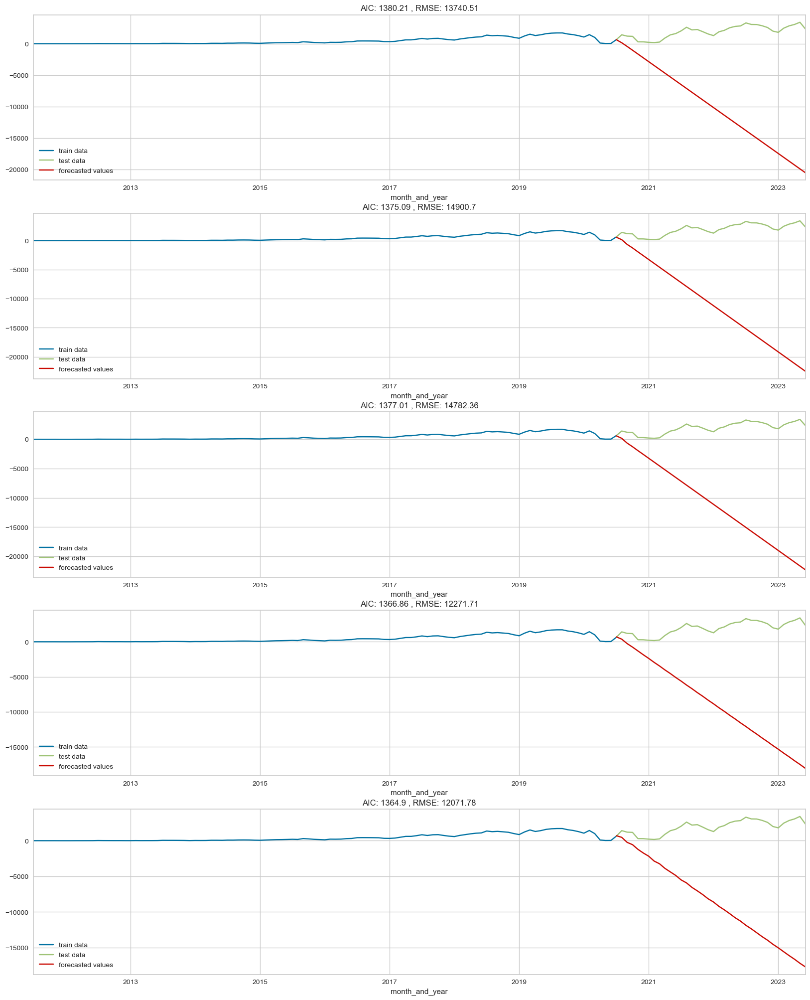

In [99]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows = 5, ncols = 1, figsize = (20, 25))

plot_predictions(arma1_result, ax1)
plot_predictions(arma2_result, ax2)
plot_predictions(ar3ma2_result, ax3)
plot_predictions(ar2ma3_result, ax4)
plot_predictions(arma3_result, ax5)

plt.show()

### ARIMA Model

Due to including the differencing term d, we can directly use the training data without requiring stationarity.

In [100]:
#Model with p=1, d=2, and q=0
ar_1_d_2_ma_0 = ARIMA(num_stays_by_mth_train, order=(1,2,0))

#Model with p=2, d=2, and q=0
ar_2_d_2_ma_0 = ARIMA(num_stays_by_mth_train, order=(2,2,0))

#Model with p=3, d=2, and q=0
ar_3_d_2_ma_0 = ARIMA(num_stays_by_mth_train, order=(3,2,0))

#Model with p=3, d=2, and q=1
ar_3_d_2_ma_1 = ARIMA(num_stays_by_mth_train, order=(3,2,1))

#Model with p=3, d=2, and q=2
ar_3_d_2_ma_2 = ARIMA(num_stays_by_mth_train, order=(3,2,2))

#Model with p=3, d=2, and q=3
ar_3_d_2_ma_3 = ARIMA(num_stays_by_mth_train, order=(3,2,3))

In [101]:
def plot_predictions_ARIMA(results, ax):

    # We are taking double cumulative sum of forecasted values (which is inverse of double differencing)
    # And we are also adding the last element of the training data to the forecasted values to get back to the original scale
    predict = results.predict(start = num_stays_by_mth_test.index[0], end = num_stays_by_mth_test.index[-1])
    predict.index = num_stays_by_mth_test.index
    
    num_stays_by_mth_train.plot(ax = ax, label = 'train', title = 'AIC: {}'.format(np.round(results.aic, 2)) + ' , ' + 'RMSE: {}'.format(np.round(np.sqrt(mean_squared_error(num_stays_by_mth_test, predict)), 2)))
    
    num_stays_by_mth_test.plot(ax=ax)
    predict.plot(ax=ax)
    ax.legend(['train data', 'test data', 'forecasted values'])

In [102]:
ar_1_d_2_ma_0_result = ar_1_d_2_ma_0.fit()
ar_2_d_2_ma_0_result = ar_2_d_2_ma_0.fit()
ar_3_d_2_ma_0_result = ar_3_d_2_ma_0.fit()
ar_3_d_2_ma_1_result = ar_3_d_2_ma_1.fit()
ar_3_d_2_ma_2_result = ar_3_d_2_ma_2.fit()
ar_3_d_2_ma_3_result = ar_3_d_2_ma_3.fit()

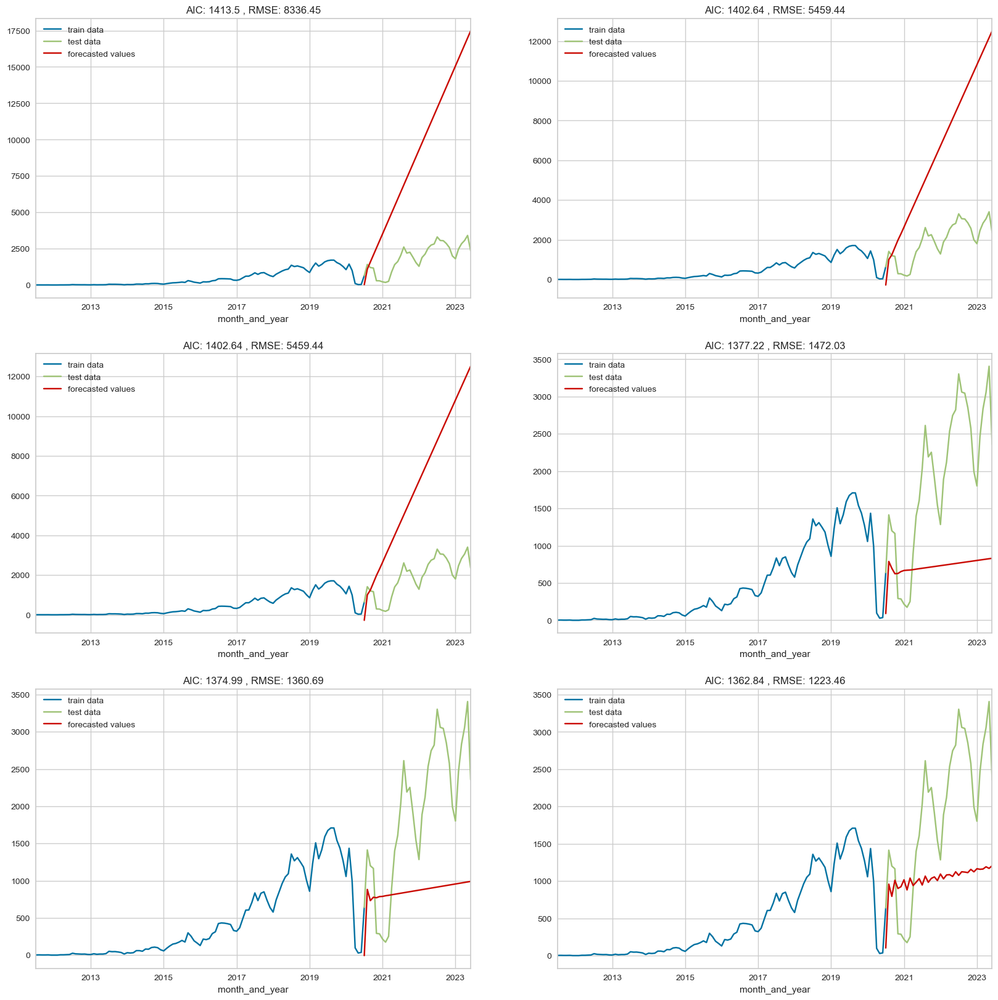

In [103]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(nrows = 3, ncols = 2, figsize = (20, 20))

plot_predictions_ARIMA(ar_1_d_2_ma_0_result, ax1)
plot_predictions_ARIMA(ar_2_d_2_ma_0_result, ax2)
plot_predictions_ARIMA(ar_2_d_2_ma_0_result, ax3)
plot_predictions_ARIMA(ar_3_d_2_ma_1_result, ax4)
plot_predictions_ARIMA(ar_3_d_2_ma_2_result, ax5)
plot_predictions_ARIMA(ar_3_d_2_ma_3_result, ax6)
plt.show()

Despite none of the moving average models fitting the data well, the moving average component does improve accuracy for ARIMA models, particularly regarding the RMSE.

Overall, the best performing model currently is the ARIMA(3,2,3) model, however I would like to see if there is a better model. As AIC is relatively similar across models, the main comparison point is going to be the RMSE.

ARIMA(3,2,3) picks up on the overall trend, however, they don't take into account the seasonality present in the data. In order to fix this, I'll also test another type of time series model, called SARIMA, which is a form of an ARIMA that takes into account seasonality.

### Auto ARIMA

In [104]:
import pmdarima as pm

auto_arima_model = pm.auto_arima(num_stays_by_mth_train, d = 2, seasonal = True, trace = True, 
                                 error_action = 'ignore', suppress_warnings = True)

print(auto_arima_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=1418.192, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=1413.504, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.04 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=1402.641, Time=0.06 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=1401.839, Time=0.07 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=1374.744, Time=0.15 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=1376.539, Time=0.16 sec
 ARIMA(4,2,1)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(5,2,1)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=1376.708, Time=0.19 sec

Best model:  ARIMA(4,2,0)(0,0,0)[0]          
Total fit time: 1.647 seconds
                               SARIMAX Results                                
Dep. Variable:                    

The auto ARIMA recommends ARIMA(4, 2, 0) as the best model, which contradicts with the best model chosen currently. 
However, the auto ARIMA only attempts to minimise AIC; it does not attempt to minimise any other error metrics unlike performing various models manually or using pycaret.

### Pycaret suggested model

In [105]:
import pycaret.time_series as pyc_time
from pycaret.time_series import *
s = pyc_time.setup(num_of_stays_by_month, fh=35, session_id = 2)

available_models = pyc_time.models()
available_models

,Description,Value
0,session_id,2
1,Target,num_of_stays
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(144, 1)"
5,Transformed data shape,"(144, 1)"
6,Transformed train set shape,"(109, 1)"
7,Transformed test set shape,"(35, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,Name,Reference,Turbo
ID,,,
naive,Naive Forecaster,sktime.forecasting.naive.NaiveForecaster,True
grand_means,Grand Means Forecaster,sktime.forecasting.naive.NaiveForecaster,True
snaive,Seasonal Naive Forecaster,sktime.forecasting.naive.NaiveForecaster,True
polytrend,Polynomial Trend Forecaster,sktime.forecasting.trend.PolynomialTrendForeca...,True
arima,ARIMA,sktime.forecasting.arima.ARIMA,True
auto_arima,Auto ARIMA,sktime.forecasting.arima.AutoARIMA,True
exp_smooth,Exponential Smoothing,sktime.forecasting.exp_smoothing.ExponentialSm...,True
ets,ETS,sktime.forecasting.ets.AutoETS,True
theta,Theta Forecaster,sktime.forecasting.theta.ThetaForecaster,True


In [106]:
best_baseline = compare_models(sort='RMSE', n_select=3)

best_tuned_models = [tune_model(model) for model in best_baseline]

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
theta,Theta Forecaster,nan,nan,216.8277,271.7435,244507960052846.3750,0.9714,-0.7710,0.0433
naive,Naive Forecaster,nan,nan,234.8286,290.6484,257348550135457.9062,0.9827,-0.8913,0.7067
polytrend,Polynomial Trend Forecaster,nan,nan,277.8828,322.9802,231613695121915.2812,1.1357,-1.1418,0.0267
croston,Croston,nan,nan,314.8029,364.9087,267771166415943.8438,1.2283,-1.5064,0.0233
grand_means,Grand Means Forecaster,nan,nan,410.5395,462.2791,289517118902389.7500,1.5167,-2.4313,0.4633


Processing:   0%|          | 0/119 [00:00<?, ?it/s]

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,26.7470,36.9180,733523880158536.6250,1.6899,-1.1199
1,2014-09,9.0803,10.6555,196.4038,269.0039,0.5192,0.7375,-0.8464
2,2017-08,4.2616,3.5447,427.3323,509.3087,2.0202,0.4868,-0.3468
Mean,NaT,nan,nan,216.8277,271.7435,244507960052846.3750,0.9714,-0.7710
SD,NaT,nan,nan,164.1747,192.8624,345786473214912.5000,0.5183,0.3201


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.1s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,25.9143,36.0115,772045650406371.2500,1.5726,-1.0171
1,2014-09,9.7723,11.3268,211.3714,285.9515,0.5626,0.8308,-1.0864
2,2017-08,4.6592,3.8278,467.2000,549.9821,1.7711,0.5448,-0.5705
Mean,NaT,nan,nan,234.8286,290.6484,257348550135457.9062,0.9827,-0.8913
SD,NaT,nan,nan,180.9161,209.8539,363945809858615.2500,0.4331,0.2286


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.1s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,201.0305,272.8168,1303535994236349.5000,1.9777,-114.7653
1,2014-09,9.4478,10.5609,204.3534,266.6136,0.6452,0.4486,-0.8138
2,2017-08,9.9690,10.3219,999.6345,1483.0466,8.4374,0.5489,-10.4198
Mean,NaT,nan,nan,468.3395,674.1590,434511998078786.2500,0.9917,-41.9996
SD,NaT,nan,nan,375.6847,571.9755,614492760696845.2500,0.6984,51.6023


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  23 out of  30 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    0.3s finished


Pycaret recommends a Theta Forecaster model as the best time series model, as it is the model with the most error metrics that are low.

In [107]:
print(best_tuned_models)

[ThetaForecaster(deseasonalize=False, sp=12), NaiveForecaster(), PolynomialTrendForecaster()]


In [108]:
theta = create_model('theta', deseasonalize=False)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,26.7470,36.9180,733523880158536.6250,1.6899,-1.1199
1,2014-09,9.0803,10.6555,196.4038,269.0039,0.5192,0.7375,-0.8464
2,2017-08,4.2616,3.5447,427.3323,509.3087,2.0202,0.4868,-0.3468
Mean,NaT,nan,nan,216.8277,271.7435,244507960052846.3750,0.9714,-0.7710
SD,NaT,nan,nan,164.1747,192.8624,345786473214912.5000,0.5183,0.3201


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [109]:
tuned_theta = tune_model(theta)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,26.7470,36.9180,733523880158536.6250,1.6899,-1.1199
1,2014-09,9.0803,10.6555,196.4038,269.0039,0.5192,0.7375,-0.8464
2,2017-08,4.2616,3.5447,427.3323,509.3087,2.0202,0.4868,-0.3468
Mean,NaT,nan,nan,216.8277,271.7435,244507960052846.3750,0.9714,-0.7710
SD,NaT,nan,nan,164.1747,192.8624,345786473214912.5000,0.5183,0.3201


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.1s finished


In [110]:
check_stats(tuned_theta)

,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Residual,Length,,109.0
1,Summary,Statistics,Residual,# Missing Values,,0.0
2,Summary,Statistics,Residual,Mean,,359.166029
3,Summary,Statistics,Residual,Median,,410.9436
4,Summary,Statistics,Residual,Standard Deviation,,259.834191
5,Summary,Statistics,Residual,Variance,,67513.806679
6,Summary,Statistics,Residual,Kurtosis,,4.19542
7,Summary,Statistics,Residual,Skewness,,-1.501335
8,Summary,Statistics,Residual,# Distinct Values,,109.0
9,White Noise,Ljung-Box,Residual,Test Statictic,"{'alpha': 0.05, 'K': 24}",577.972604


In [111]:
plot_model(tuned_theta, plot = 'forecast')

The theta forecaster does not attempt to predict with seasonality, even though the model type does acknowledge seasonality, and the forecast is significantly lower than the actual data, though the uppper end of the prediction interval better predicts the data. The forecast is likely significantly lower than the actual data due to the huge dip that occurred between March 2020 and July 2020 being included in the training data, which was a temporary dip rather than a permanent decline.

In [112]:
predict = predict_model(tuned_theta)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,Theta Forecaster,5.3861,3.9958,1293.0541,1463.5619,0.7994,0.9132,-1.4525


For predictions, the RMSE and MAE are far higher compared to the original statistics presented for this model. I will test blending some of the models suggested by pycaret to see if better results can be achieved.

In [113]:
num_of_stays_by_month.tail()

,num_of_stays
month_and_year,
2023-02-28,2464
2023-03-31,2835
2023-04-30,3057
2023-05-31,3406
2023-06-30,2357


In [114]:
predict.tail()

,y_pred
2023-02,850.3524
2023-03,857.0193
2023-04,863.6861
2023-05,870.3530
2023-06,877.0198


In [115]:
blended = blend_models(best_tuned_models, method='mean')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2011-10,nan,nan,26.7471,36.9181,733470205310217.1250,1.6899,-1.1199
1,2014-09,9.5547,11.0136,206.6646,278.0438,0.5507,0.8083,-0.9726
2,2017-08,4.8882,3.9334,490.1610,565.1467,1.8683,0.5730,-0.6583
Mean,NaT,nan,nan,241.1909,293.3695,244490068436739.8438,1.0237,-0.9169
SD,NaT,nan,nan,190.7567,215.9205,345761170648761.9375,0.4807,0.1925


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [116]:
plot_model(blended, plot = 'forecast', data_kwargs = {'seasonal_period': 12})

In [117]:
blend_predict = predict_model(blended)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,EnsembleForecaster,4.8683,3.6282,1168.7469,1328.8956,0.8293,0.7941,-1.0220


In terms of statistics for the predictions, bledning the 3 best models in terms of RSME does improve error metrics. However, the blended model still only attempts to a predict a trend without showing any seasonality, which the data does have and is a useful factor considering that Airbnbs in Bristol tend to be more popular in summer months than winter months.

In [118]:
blend_predict.tail()

,y_pred
2023-02,1024.3826
2023-03,1031.0494
2023-04,1037.7163
2023-05,1044.3831
2023-06,1051.0499


Overall, the blended model performed better than the theta forecaster on its own on the test data, however, neither model appeared to acknowledge seasonality in their predictions.

### SARIMA

In [119]:
from statsmodels.tsa.statespace.sarimax import SARIMAX #importing the SARIMA model

SARIMA_model_auto = pm.auto_arima(num_stays_by_mth_train, m=12)

print(SARIMA_model_auto.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  109
Model:             SARIMAX(5, 0, 1)x(2, 1, [], 12)   Log Likelihood                -597.247
Date:                             Fri, 01 Dec 2023   AIC                           1212.494
Time:                                     23:56:33   BIC                           1235.667
Sample:                                 07-31-2011   HQIC                          1221.864
                                      - 07-31-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2275      0.328      3.744      0.000       0.585       1.870
ar.L2         -0.3591      

In [120]:
SARIMA_model = SARIMAX(num_stays_by_mth_train, order=(3, 2, 0), seasonal_order=(3, 2, 0, 12))#m=12 as this is monthly data
SARIMA_model1 = SARIMAX(num_stays_by_mth_train, order=(2, 1, 1), seasonal_order=(0, 1, 0, 12))#d=1 and p=2
SARIMA_model2 = SARIMAX(num_stays_by_mth_train, order=(2, 2, 1), seasonal_order=(2, 2, 0, 12))#d=2
SARIMA_model3 = SARIMAX(num_stays_by_mth_train, order=(3, 2, 1), seasonal_order=(3, 2, 0, 12))#p=3
SARIMA_model4 = SARIMAX(num_stays_by_mth_train, order=(5, 0, 1), seasonal_order=(2, 1, 0, 12))#model recommended by auto ARIMA
SARIMA_model5 = SARIMAX(num_stays_by_mth_train, order=(2, 1, 1), seasonal_order=(2, 0, 0, 12))#d=1 and p=2

In [121]:
SARIMA_result = SARIMA_model.fit()
SARIMA_result1 = SARIMA_model1.fit()
SARIMA_result2 = SARIMA_model2.fit()
SARIMA_result3 = SARIMA_model3.fit()
SARIMA_result4 = SARIMA_model4.fit()
SARIMA_result5 = SARIMA_model5.fit()

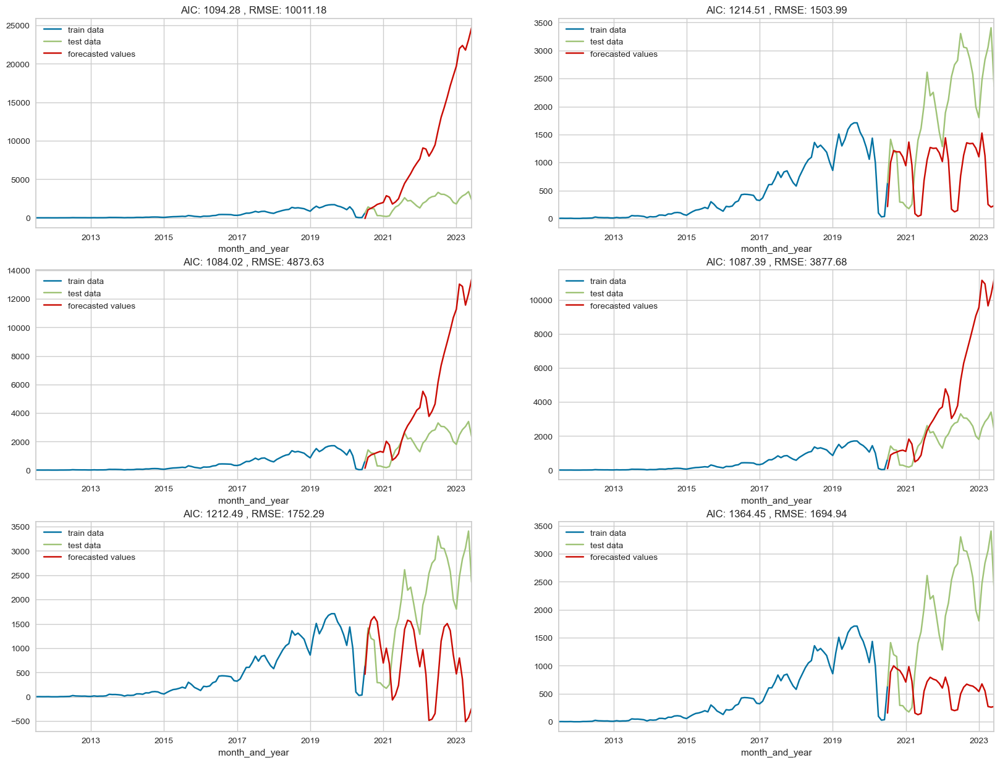

In [122]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))

plot_predictions_ARIMA(SARIMA_result, ax1)
plot_predictions_ARIMA(SARIMA_result1, ax2)
plot_predictions_ARIMA(SARIMA_result2, ax3)
plot_predictions_ARIMA(SARIMA_result3, ax4)
plot_predictions_ARIMA(SARIMA_result4, ax5)
plot_predictions_ARIMA(SARIMA_result5, ax6)
plt.show()

The best SARIMA time series model overall is (2, 1, 1)x(0, 1, 0, 12), which contradicts the auto ARIMA recommended SARIMA model, which is (5, 0, 1)x(2, 1, 0, 12), however, auto ARIMA bases its decision on minimising AIC only rather than minimising various error metrics.

### Final time series model

For my final model, I have decided to use a SARIMA (2, 1, 1)x(0, 1, 0, 12) model. This is because this model acknowledges the seasonality present in the data and it has one of the lowest AIC and RSME errors out of the models.

In [123]:
final_model_Bristol = SARIMAX(num_of_stays_by_month, order=(2, 1, 1), seasonal_order=(0, 1, 0, 12))
#fitting the final model using the complete dataset

final_model_results_Bristol = final_model_Bristol.fit()

In [124]:
num_of_stays_by_month.tail()

,num_of_stays
month_and_year,
2023-02-28,2464
2023-03-31,2835
2023-04-30,3057
2023-05-31,3406
2023-06-30,2357


In [125]:
final_model_predictions = final_model_results_Bristol.predict(start='2023-07-31', end='2030-12-31')

In [126]:
final_model_predictions = pd.DataFrame(final_model_predictions)
#type(final_model_predictions)

In [127]:
final_model_predictions = final_model_predictions.rename(columns={'predicted_mean': 'num_of_stays'})

all_data = pd.concat([num_of_stays_by_month, final_model_predictions])

In [128]:
import matplotlib.dates as mdates
x = mdates.date2num(all_data.index)
trendline = np.poly1d(np.polyfit(x, all_data['num_of_stays'], 3))

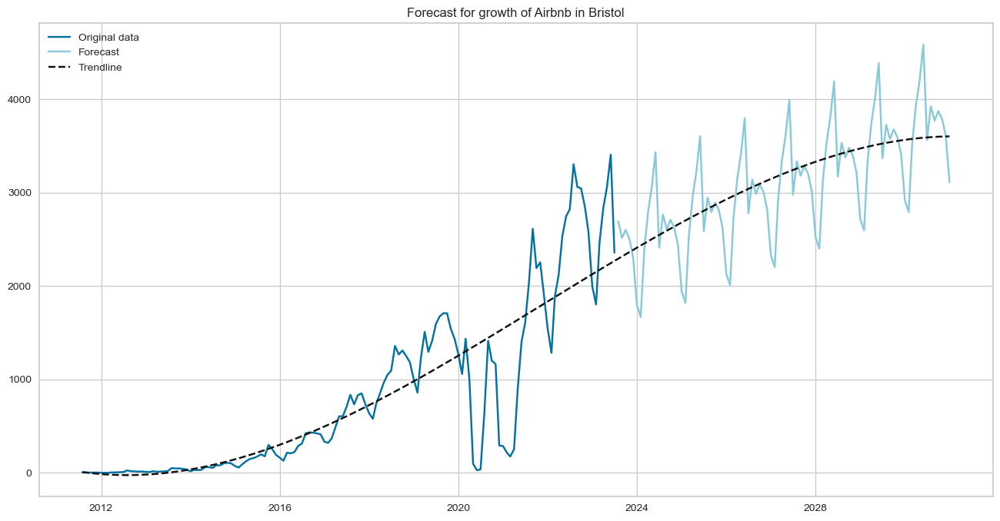

In [129]:
plt.figure(figsize=(16, 8))
plt.plot(num_of_stays_by_month, label='Original data', color='b')
plt.plot(final_model_predictions, label='Forecast', color='c')
plt.plot(x, trendline(x), 'k--', label='Trendline')
plt.legend()
plt.title('Forecast for growth of Airbnb in Bristol')
plt.show()

Overall, the number of stays in Airbnb per month is predicted to keep growing at least until 2030, though more slowly compared to previous years, partially because Airbnb has become more established, so is unlikely to see the exponential growth that it saw from 2011 to the beginning of 2020. Additionally, Airbnb now faces competition from sites such as VRBO and Booking.com in the market for entire homes to rent, which has become a big part of the Airbnb market even though wasn't the original intention of Airbnb. The public sentiment towards Airbnb has overall become more negative than it used to be, which could explain the slow down in growth compared to 2011 to the beginning of 2020. 

Although there was a huge dip in the number of stays in 2020 and 2021 due to lockdowns put in place as a result of the Covid-19 pandemic, Airbnb picked back up at higher number than they were at the beginning of 2020 when the dip happened, suggesting that as long as people are travelling, some people choose to stay at Airbnbs. The number of stays per month is predicted to rise to ~3,500 by the end of 2030. 

Considering the potential decrease in long-term rentals due to Airbnb, especially at a time when there is a cost of living crisis, Bristol City Council may have a desire to reduce the growth of Airbnb, particularly as it has the third most expensive average rent in the UK, and Airbnb does increase rents and house prices, as said in Duso et. al (2021).

Furthermore, the predicted increase in demand risks having a negative impact on the hotel industry in Bristol due to increased competition from Airbnbs which don't have to follow the same regulations that hotels do, nor do they need to pay the same taxes that hotels or bed and breakfasts do. The Bristol Hoteliers Association have called the city's leaders to look into Airbnb due to the damage on their trade.

## Policy recommendations 

These policy recommendations are not an exhaustive list of recommendations, and are a starting off point for Airbnb policy in Bristol. These are my policy recommendations: 

- Require Airbnb hosts renting out entire homes to follow the same regulations that hotels have to follow, such as paying business rates, fire assessments, health and safety checks, etc.
- Require Airbnb hosts to have a license in order to operate, with consequences for non-compliance such as heavy fines; this will enable control over the amount of Airbnb listings available to rent and for how many days in the year they can be rented out for.
- Reduce the number of days an Airbnb listing can be available to rent to under 180 days a year, particularly for listings that are entire homes
- Require hosts to live in the property they're listing for at least 6 months of the year.

It would be useful to collaborate with Airbnb to ensure that listings that don't meet regulatory standards are removed from the Airbnb website in order to best ensure compliance with regulations.

## Further research points

In order to further inform policies for Airbnb within Bristol, here are some further points to consider that were outide the scope of the data presented:

- Analysing data on tax revenue generated by Airbnb
- Sentiment analysis of people in Bristol's views on Airbnb
- The impact of Airbnb on tourism in Bristol
- Detailed analysis of the effectiveness of existing regulations in other cities
- Carry out legal framework analysis, i.e. assess local legal frameworks
- Economic effects of Airbnb on local businesses and jobs
- Comparison between the trends shown in this data and macroeconomic factors
- Impact of Airbnb policies on different demographic groups

## References

- Duso et. al, 2021: Airbnb and Rental Markets: Evidence from Berlin. 
  URL: https://www.bristol.ac.uk/efm/media/workingpapers/working_papers/pdffiles/dp21746.pdf